## Objective
We are given Data for 5 different stock exchanges from 12-31-2009 to 11-15-2017. Our goal is to predict the values of the `Close` column which represents the closing value of 100-index of a stock exhcange on a particular day.

In this notebook, we have used the following statistical methods to forecast the `Close` values:


1.   Moving Averages (or Simple Moving Averages)
2.   EWMA
3.   Auto Regression
4.   ARIMA
5.   ARIMAX
6.   SARIMAX



## Download and Read the Datasets

In [1]:
!gdown https://drive.google.com/uc?id=10ROg0kbOsIYH6IYaJwwo5HtZqwe6sahv
!gdown https://drive.google.com/uc?id=1PnAHyD-6HJuet9Ic896q2TNF_8ihrd6o
!gdown https://drive.google.com/uc?id=1fdpbC7wAvCHqdJcVZDIx7jUNXo9LJl_F
!gdown https://drive.google.com/uc?id=1WFLh4oCXzlrLf95jSPKjCi8Bqx-U9cUS
!gdown https://drive.google.com/uc?id=12qWmznIvt_QQYxE0RzHocKtAJ8TqeEeO

Traceback (most recent call last):
  File "/home/ahmad/anaconda3/envs/fsnet2/lib/python3.7/site-packages/urllib3/connectionpool.py", line 710, in urlopen
    chunked=chunked,
  File "/home/ahmad/anaconda3/envs/fsnet2/lib/python3.7/site-packages/urllib3/connectionpool.py", line 449, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "/home/ahmad/anaconda3/envs/fsnet2/lib/python3.7/site-packages/urllib3/connectionpool.py", line 444, in _make_request
    httplib_response = conn.getresponse()
  File "/home/ahmad/anaconda3/envs/fsnet2/lib/python3.7/http/client.py", line 1373, in getresponse
    response.begin()
  File "/home/ahmad/anaconda3/envs/fsnet2/lib/python3.7/http/client.py", line 319, in begin
    version, status, reason = self._read_status()
  File "/home/ahmad/anaconda3/envs/fsnet2/lib/python3.7/http/client.py", line 288, in _read_status
    raise RemoteDisconnected("Remote end closed connection without"
http.client.RemoteDisconnected: Rem

In [3]:
import pandas as pd
DJI = pd.read_csv('Processed_DJI.csv')
NDQ = pd.read_csv('Processed_NASDAQ.csv')
NYSE = pd.read_csv('Processed_NYSE.csv')
RUS = pd.read_csv('Processed_RUSSELL.csv')
SP = pd.read_csv('Processed_S&P.csv')

In [ ]:
DJI

In [ ]:
NDQ

In [ ]:
NYSE

In [ ]:
RUS

In [ ]:
SP

## Data Cleaning and Preprocessing

In [ ]:
print("DJI shape: ", DJI.shape)
print("NDQ shape: ", NDQ.shape)
print("NYSE shape: ", NYSE.shape)
print("RUS shape: ", RUS.shape)
print("SP shape: ", SP.shape)

DJI shape:  (1984, 84)
NDQ shape:  (1984, 84)
NYSE shape:  (1984, 84)
RUS shape:  (1984, 84)
SP shape:  (1984, 84)


In [ ]:
DJI.isnull().sum()

Date              0
Close             0
Volume            3
mom               1
mom1              2
                 ..
Dollar index-F    0
Dollar index      0
wheat-F           2
XAG               0
XAU               0
Length: 84, dtype: int64

DJI has no missing values for `Date` and `Close` columns

In [ ]:
NDQ.isnull().sum()

Date              0
Close             0
Volume            1
mom               1
mom1              2
                 ..
Dollar index-F    0
Dollar index      0
wheat-F           2
XAG               0
XAU               0
Length: 84, dtype: int64

NDQ has no missing values for `Date` and `Close` columns

In [ ]:
NYSE.isnull().sum()

Date              0
Close             0
Volume            1
mom               1
mom1              2
                 ..
Dollar index-F    0
Dollar index      0
wheat-F           2
XAG               0
XAU               0
Length: 84, dtype: int64

NYSE has no missing values for `Date` and `Close` columns

In [ ]:
RUS.isnull().sum()

Date              0
Close             0
Volume            1
mom               1
mom1              2
                 ..
Dollar index-F    0
Dollar index      0
wheat-F           2
XAG               0
XAU               0
Length: 84, dtype: int64

RUS has no missing values for `Date` and `Close` columns

In [ ]:
SP.isnull().sum()

Date              0
Close             0
Volume            1
mom               1
mom1              2
                 ..
Dollar index-F    0
Dollar index      0
wheat-F           2
XAG               0
XAU               0
Length: 84, dtype: int64

SP has no missing values for `Date` and `Close` columns

### Converting the Data in Univariate format 
Since our statistical models can only take one variable as input and perfom forecasting on that variable, we will only consider the `Date` and `Close` column of our datasets. The `Date` column will be used as an index only.

In [ ]:
DJI = DJI[['Date','Close']]
NDQ = NDQ[['Date','Close']]
NYSE = NYSE[['Date','Close']]
RUS = RUS[['Date', 'Close']]
SP = SP[['Date', 'Close']]

In [ ]:
DJI["Date"] = pd.to_datetime(DJI["Date"])
DJI.set_index("Date", inplace=True)

NDQ["Date"] = pd.to_datetime(NDQ["Date"])
NDQ.set_index("Date", inplace=True)

NYSE["Date"] = pd.to_datetime(NYSE["Date"])
NYSE.set_index("Date", inplace=True)

RUS["Date"] = pd.to_datetime(RUS["Date"])
RUS.set_index("Date", inplace=True)

SP["Date"] = pd.to_datetime(SP["Date"])
SP.set_index("Date", inplace=True)

Let's see how the dataframes look like now

In [ ]:
DJI

,Close
Date,
2009-12-31,10428.049805
2010-01-04,10583.959961
2010-01-05,10572.019531
2010-01-06,10573.679688
2010-01-07,10606.860352
...,...
2017-11-09,23461.939453
2017-11-10,23422.210938
2017-11-13,23439.699219


Now that we are done with the general data cleaning and preprocessing, let's get started with forecasting using our statistical methods

## Moving Averages (MA)

In [4]:
def create_lag_features_all(df, n_lags):
    lag_df = df.copy()
    for column in df.columns:
        for i in range(1, n_lags + 1):
            lag_df[f'{column}_lag_{i}'] = df[column].shift(i)
    lag_df.dropna(inplace=True)
    columns = df.columns.values.tolist()
    columns.pop(0)
    lag_df.drop(columns, axis = 1, inplace = True)
    return lag_df

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from math import sqrt

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def forecast_using_sma(stock_name, stock_df, window_size):
    # Calculate the Simple Moving Average (SMA) for the specified window size
    df = stock_df.copy()
    df = df[['Close']]
    df['SMA'] = df['Close'].rolling(window=window_size).mean()

    # Split the data into train (80%) and test (20%) sets
    train_size = int(len(df) * 0.8)
    train = df.iloc[:train_size]
    test = df.iloc[train_size:]



    r_squared = r2_score(test['Close'], test['SMA'])
    mse = mean_squared_error(test['Close'], test['SMA'])
    mae = mean_absolute_error(test['Close'], test['SMA'])
    mape = mean_absolute_percentage_error(test['Close'], test['SMA'])
    rmse = sqrt(mse)

    # Update the metrics DataFrame
    metrics_sma.loc[stock_name, f'R2_{window_size}'] = r_squared
    metrics_sma.loc[stock_name, f'MSE_{window_size}'] = mse
    metrics_sma.loc[stock_name, f'MAE_{window_size}'] = mae
    metrics_sma.loc[stock_name, f'MAPE_{window_size}'] = mape
    metrics_sma.loc[stock_name, f'RMSE_{window_size}'] = rmse

    # Plot the Close and SMA columns for the train data and the Forecast for the test data
    plt.figure(figsize=(14, 8))
    plt.plot(train['Close'], label='Train Close', linewidth=2)
    plt.plot(train['SMA'], label=f'Train SMA_{window_size}', linewidth=2)
    plt.plot(test['Close'], label='Test Close', linewidth=2)
    plt.plot(test['SMA'], label='Forecast', linestyle='--', linewidth=2)

    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'{stock_name} Close Price with {window_size}-day SMA and Forecast')
    plt.legend()
    plt.grid()
    plt.show()

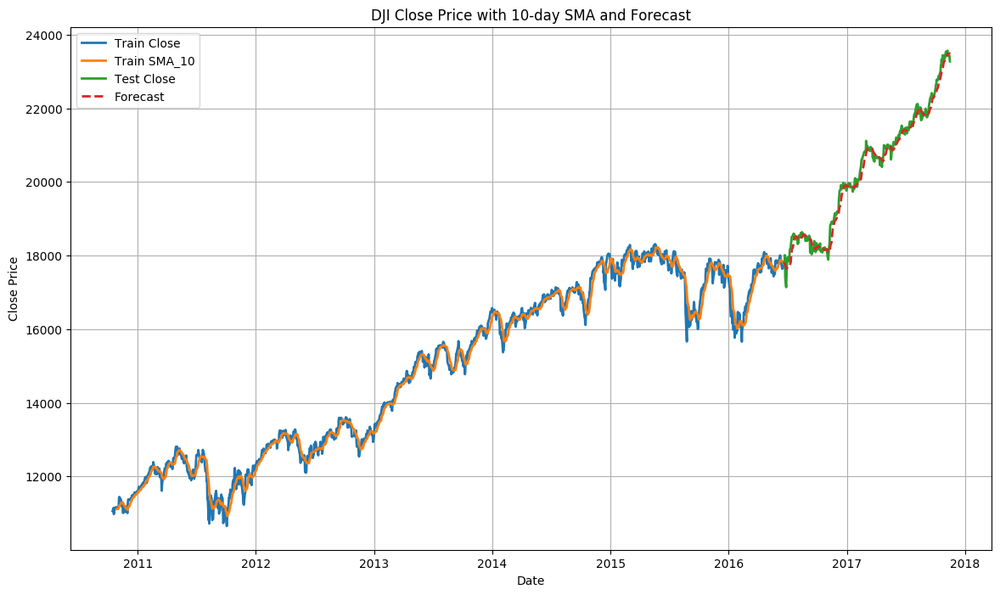

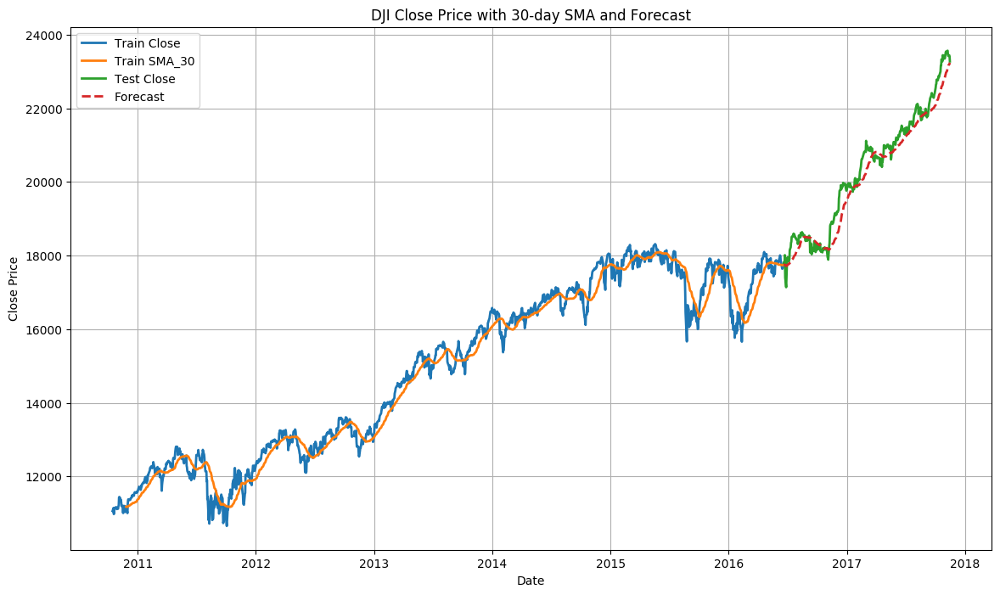

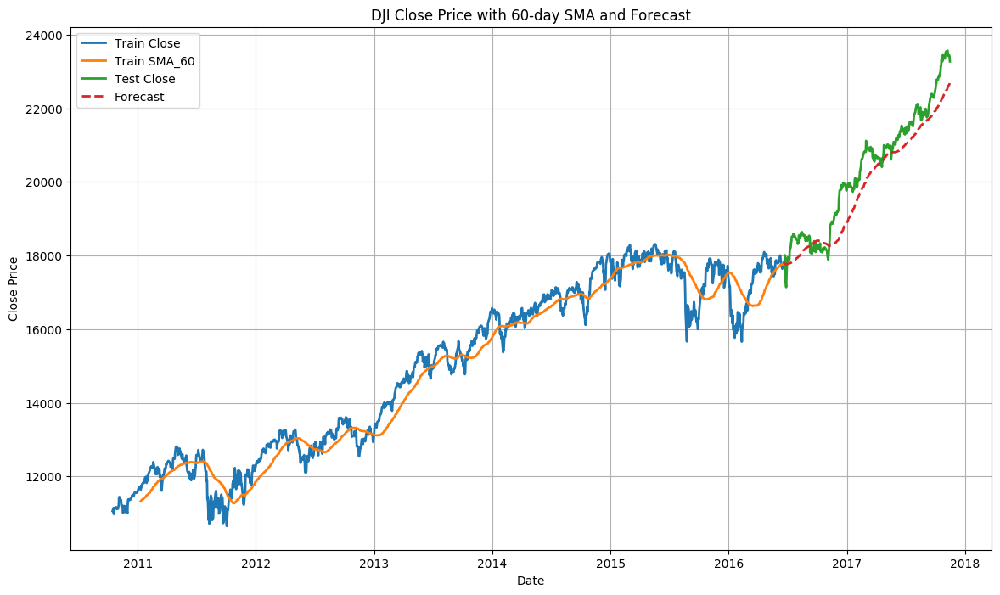

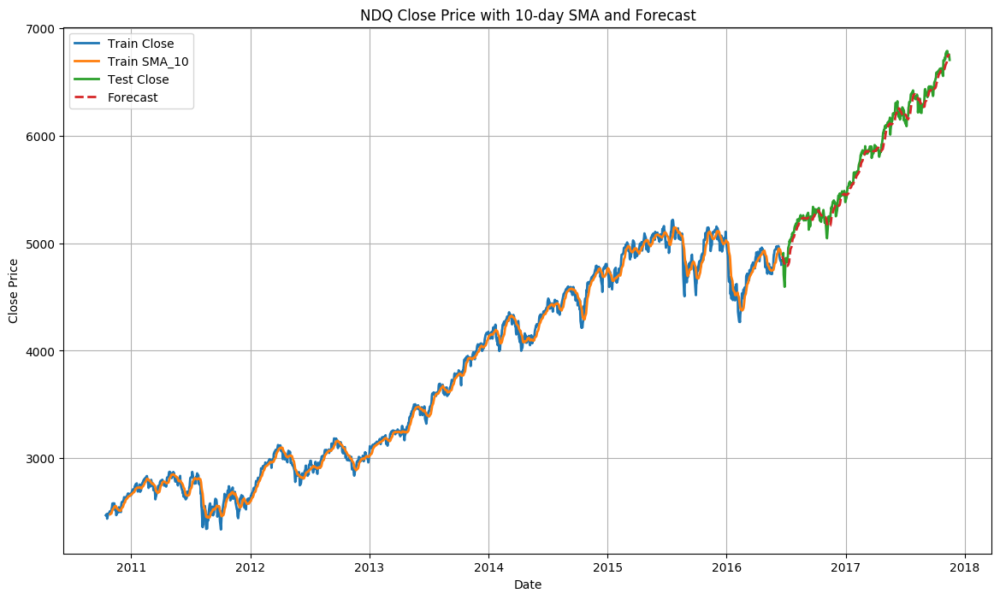

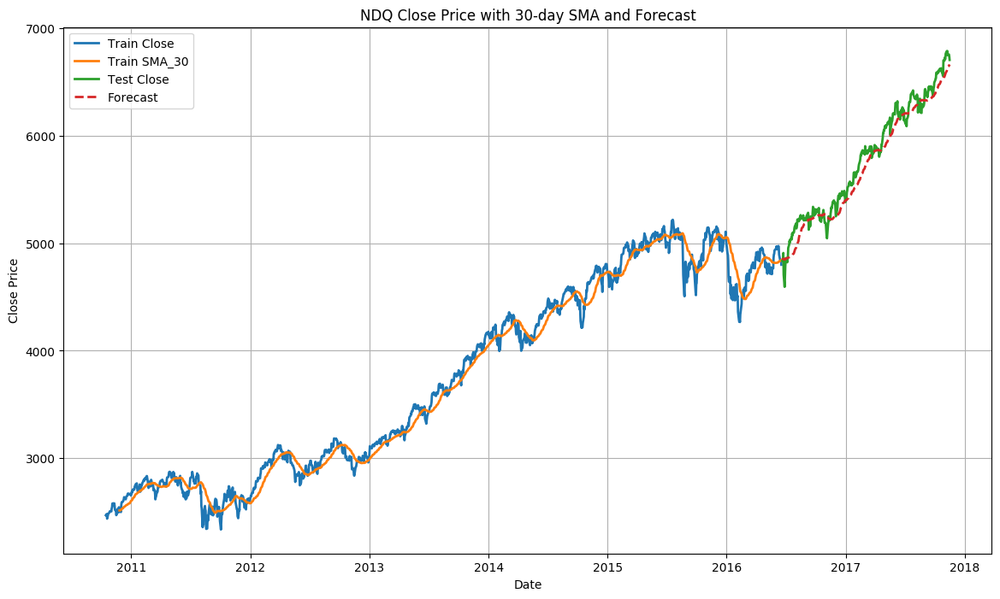

...

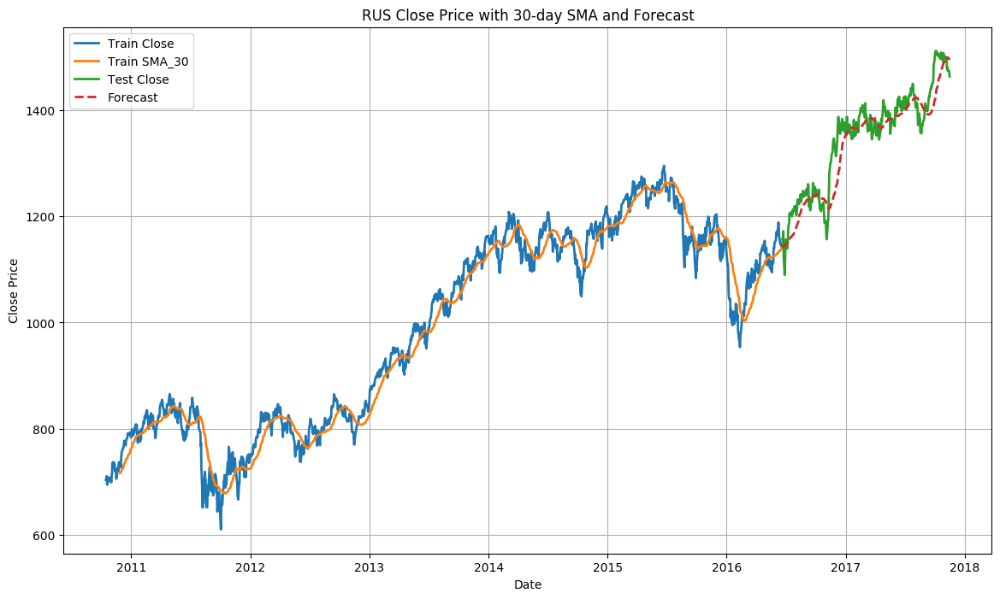

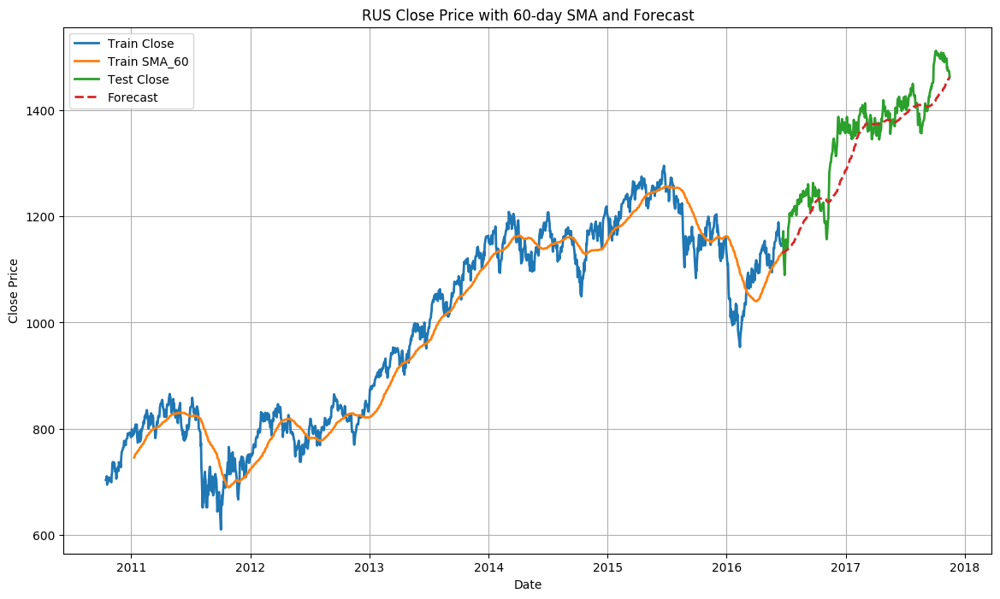

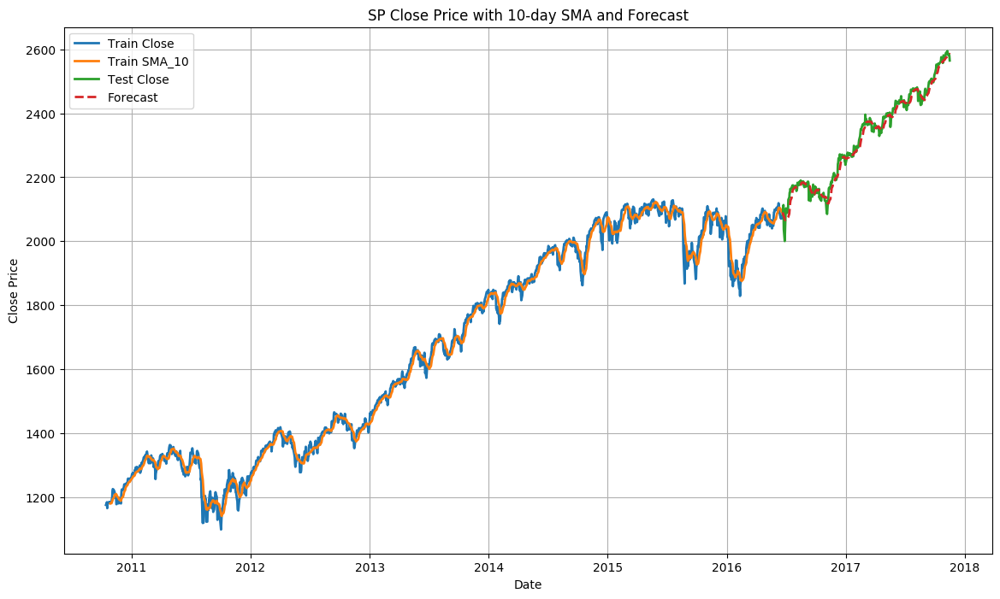

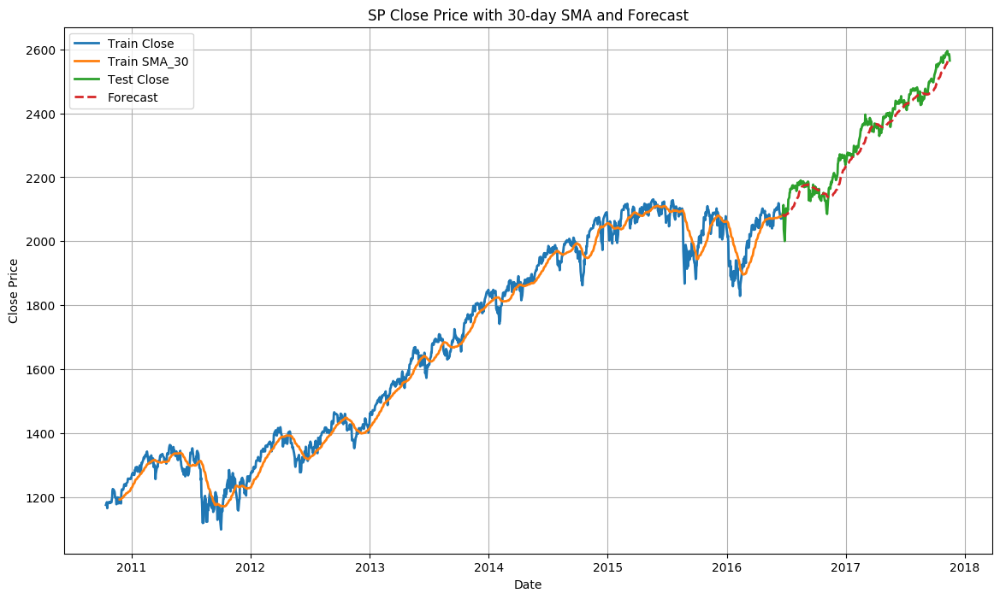

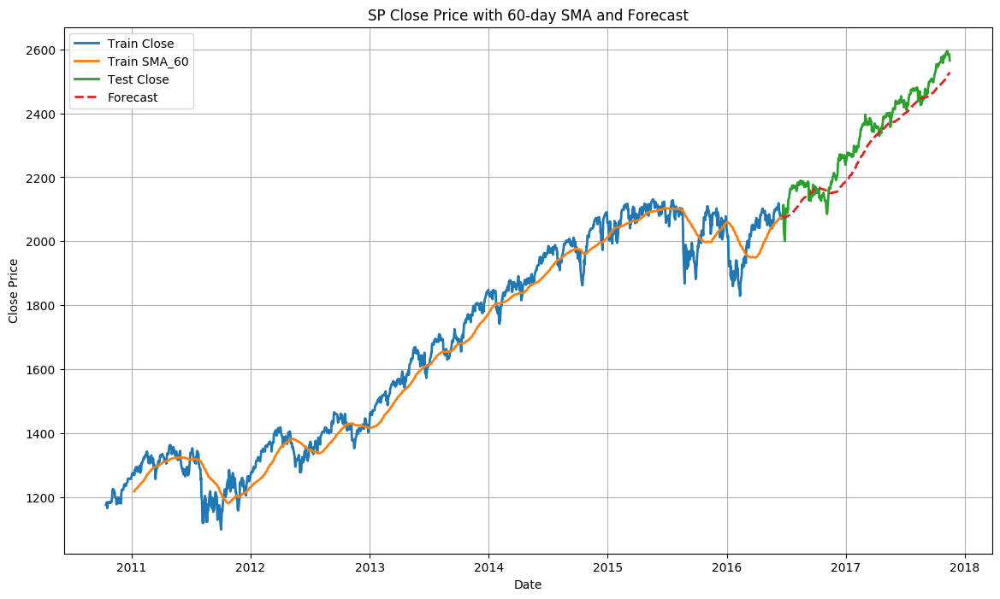

In [21]:
# Create an empty DataFrame to store the R-squared and MSE values
metrics_sma = pd.DataFrame(index=['DJI', 'NDQ', 'NYSE', 'RUS', 'SP'])

# Perform forecasts using different window sizes and stock exchange data
window_sizes = [10, 30, 60]
stock_exchanges = {
    'DJI': DJI,
    'NDQ': NDQ,
    'NYSE': NYSE,
    'RUS': RUS,
    'SP': SP
}

for stock_name, stock_df in stock_exchanges.items():
    for window_size in window_sizes:
        forecast_using_sma(stock_name, stock_df, window_size)

In [22]:
metrics_sma

,R2_10,MSE_10,MAE_10,MAPE_10,RMSE_10,R2_30,MSE_30,MAE_30,MAPE_30,RMSE_30,R2_60,MSE_60,MAE_60,MAPE_60,RMSE_60
DJI,0.988384,31030.881829,134.166802,0.665853,176.155845,0.949667,134459.012941,295.199546,1.444956,366.686532,0.876003,331248.042519,489.092063,2.382520,575.541521
NDQ,0.986936,3774.342921,49.892000,0.871876,61.435681,0.957019,12417.249891,95.219263,1.651734,111.432715,0.892548,31042.937869,156.491002,2.702783,176.190062
NYSE,0.976554,7948.642138,66.912818,0.598002,89.155158,0.926544,24902.901968,129.506569,1.145814,157.806533,0.842485,53400.625323,199.933101,1.761289,231.085753
RUS,0.959985,371.339885,14.090336,1.059832,19.270181,0.867457,1229.998843,26.687329,1.990173,35.071339,0.762294,2205.900808,37.841651,2.817901,46.967018
SP,0.984209,332.074844,13.673593,0.596785,18.222921,0.944922,1158.228544,28.462326,1.228174,34.032757,0.871424,2703.803028,45.608541,1.959868,51.998106


## EWMA

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def forecast_using_ewma(stock_name, stock_df, alpha):
    # Calculate the Exponentially Weighted Moving Average (EWMA) with the specified alpha
    df = stock_df.copy()
    df = df[["Close"]]
    df['EWMA'] = df['Close'].ewm(alpha=alpha).mean()

    # Split the data into train (80%) and test (20%) sets
    train_size = int(len(df) * 0.8)
    train = df.iloc[:train_size]
    test = df.iloc[train_size:]



    # Calculate R-squared, Mean Squared Error, Mean Absolute Error, Mean Absolute Percentage Error, and Root Mean Squared Error
    r_squared = r2_score(test['Close'], test['EWMA'])
    mse = mean_squared_error(test['Close'], test['EWMA'])
    mae = mean_absolute_error(test['Close'], test['EWMA'])
    mape = mean_absolute_percentage_error(test['Close'], test['EWMA'])
    rmse = np.sqrt(mse)

    # Update the metrics DataFrame
    metrics_ewm.loc[stock_name, f'R2_EWMA_{alpha}'] = r_squared
    metrics_ewm.loc[stock_name, f'MSE_EWMA_{alpha}'] = mse
    metrics_ewm.loc[stock_name, f'MAE_EWMA_{alpha}'] = mae
    metrics_ewm.loc[stock_name, f'MAPE_EWMA_{alpha}'] = mape
    metrics_ewm.loc[stock_name, f'RMSE_EWMA_{alpha}'] = rmse

    # Plot the Close and EWMA columns for the train data and the Forecast for the test data
    plt.figure(figsize=(14, 8))
    plt.plot(train['Close'], label='Train Close', linewidth=2)
    plt.plot(train['EWMA'], label=f'Train EWMA_{alpha}', linewidth=2)
    plt.plot(test['Close'], label='Test Close', linewidth=2)
    plt.plot(test['EWMA'], label='Forecast', linestyle='--', linewidth=2)

    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'{stock_name} Close Price with EWMA (alpha={alpha}) and Forecast')
    plt.legend()
    plt.grid()
    plt.show()


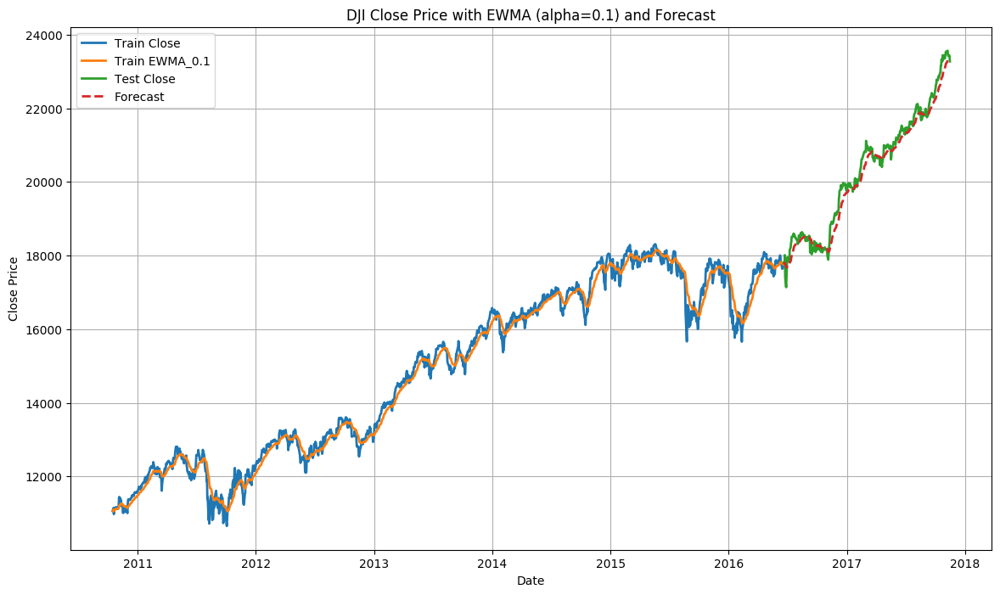

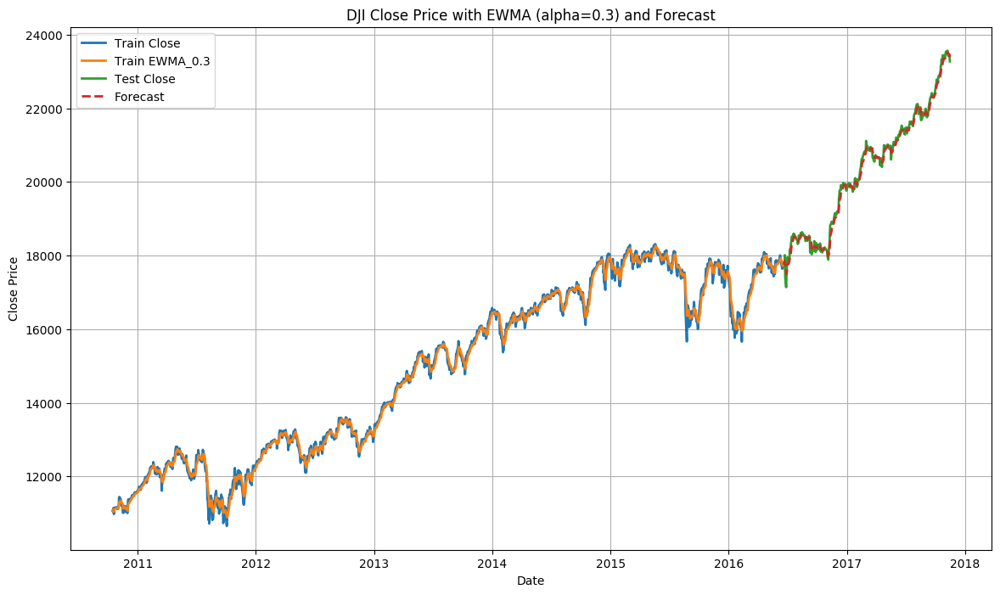

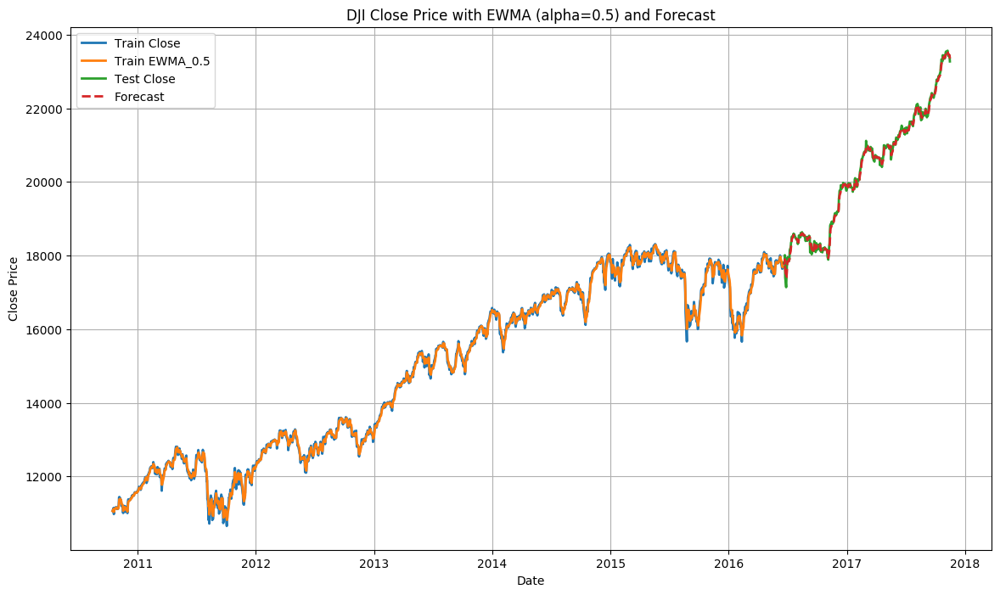

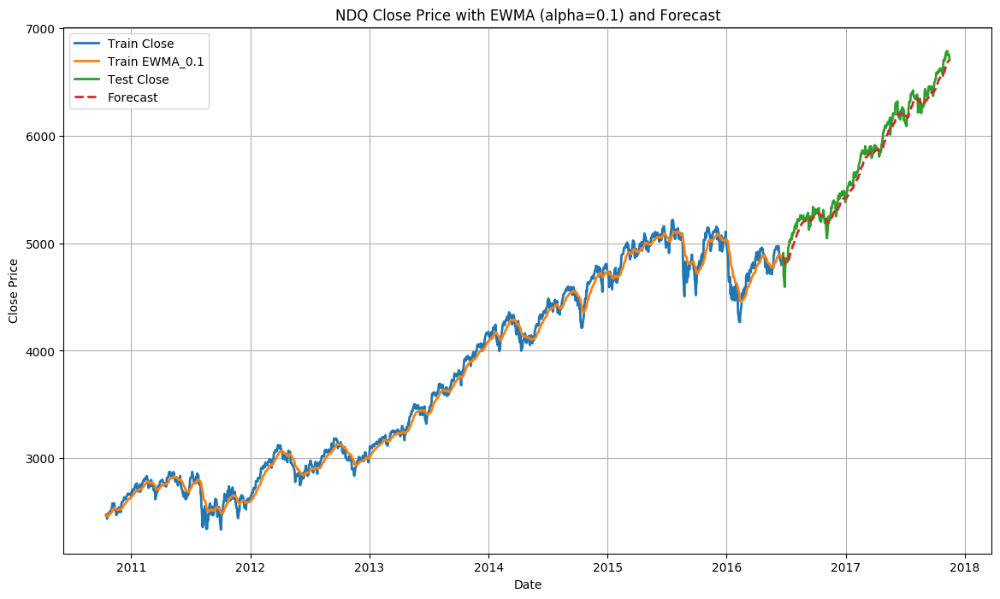

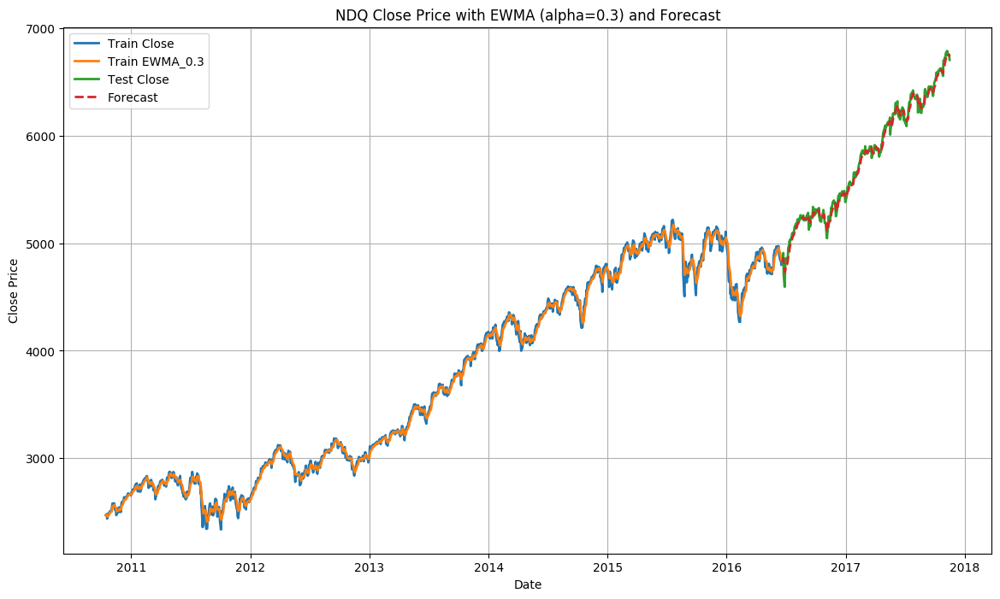

...

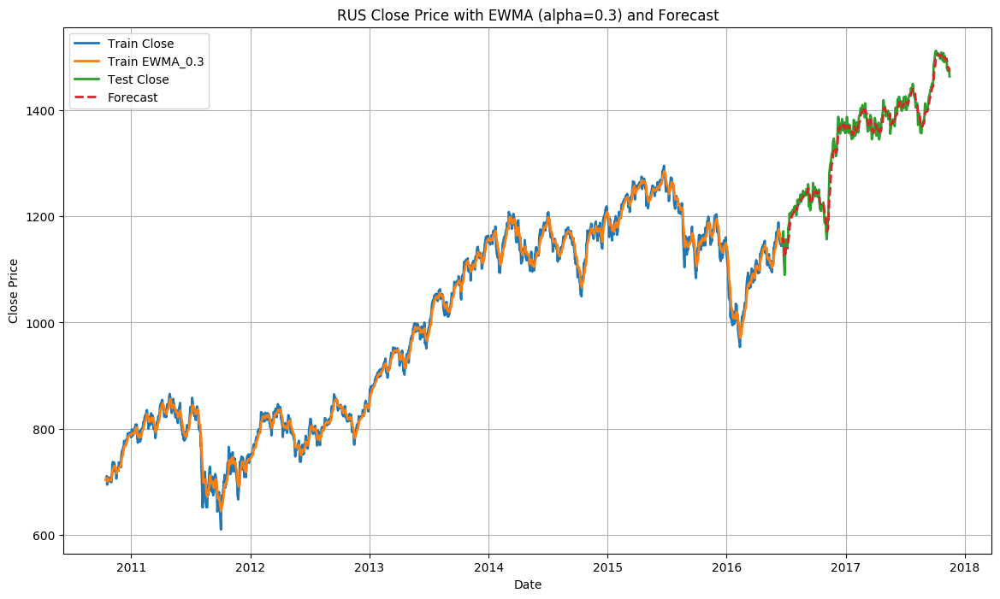

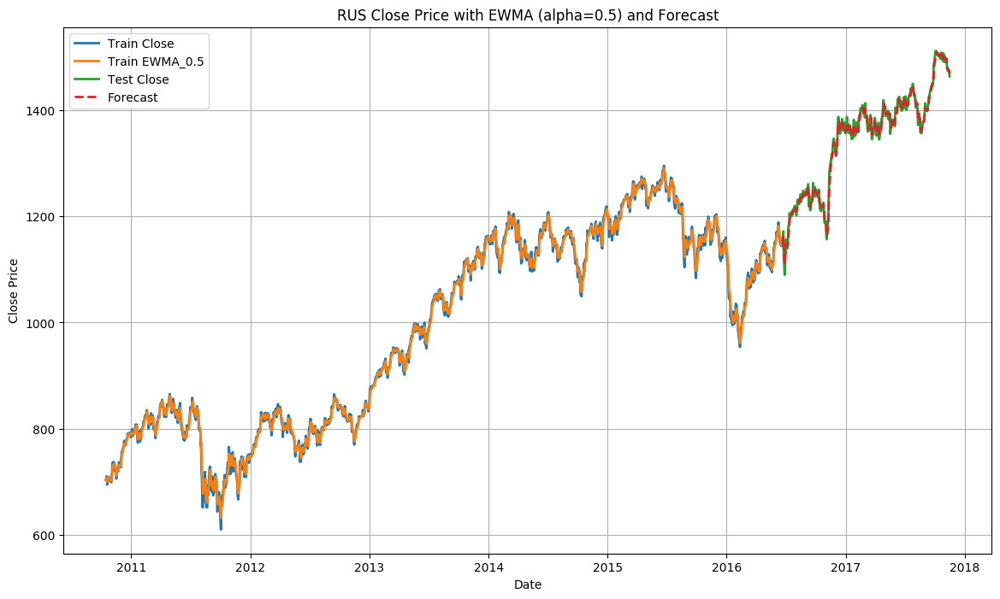

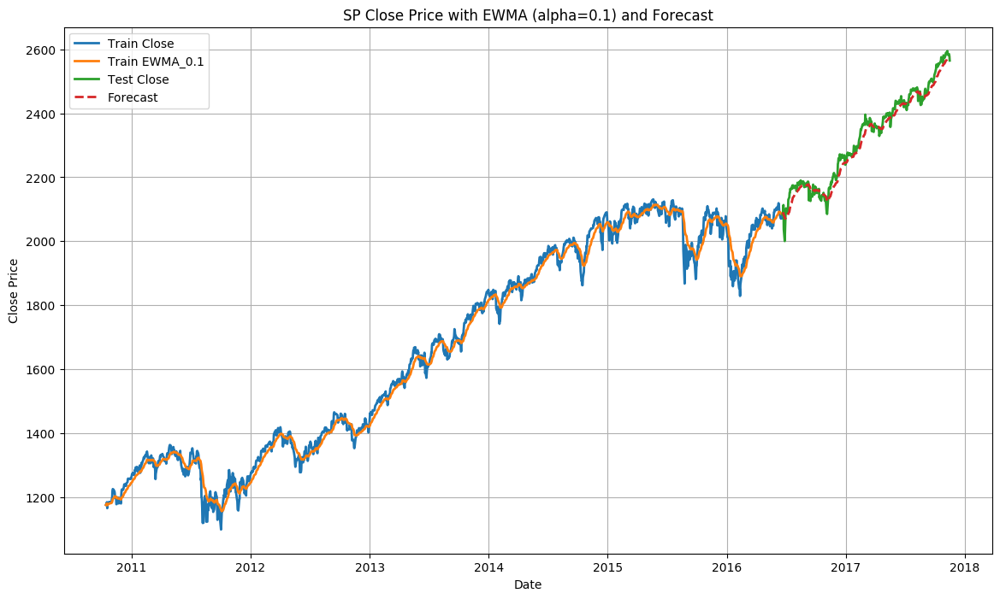

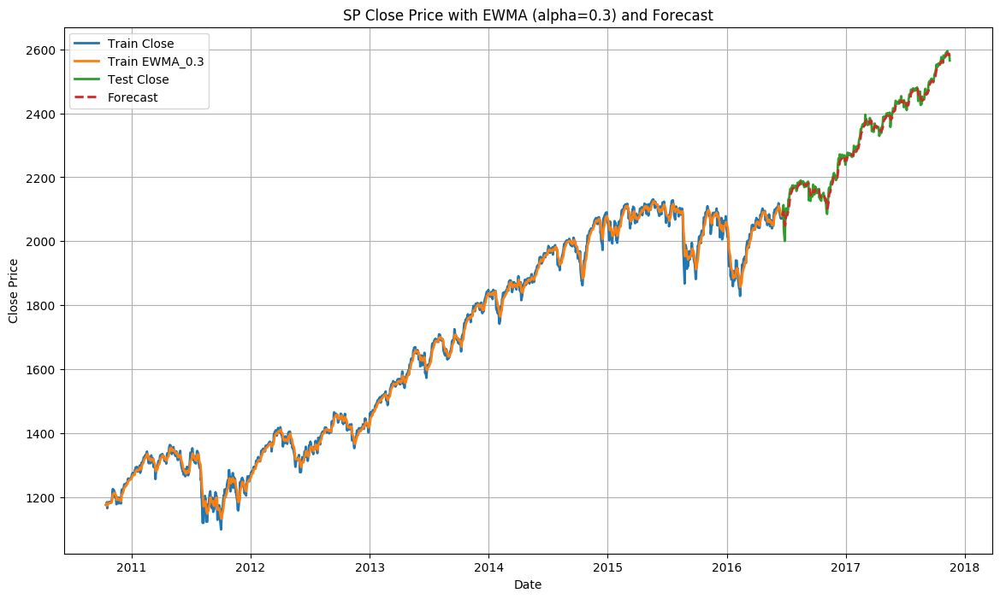

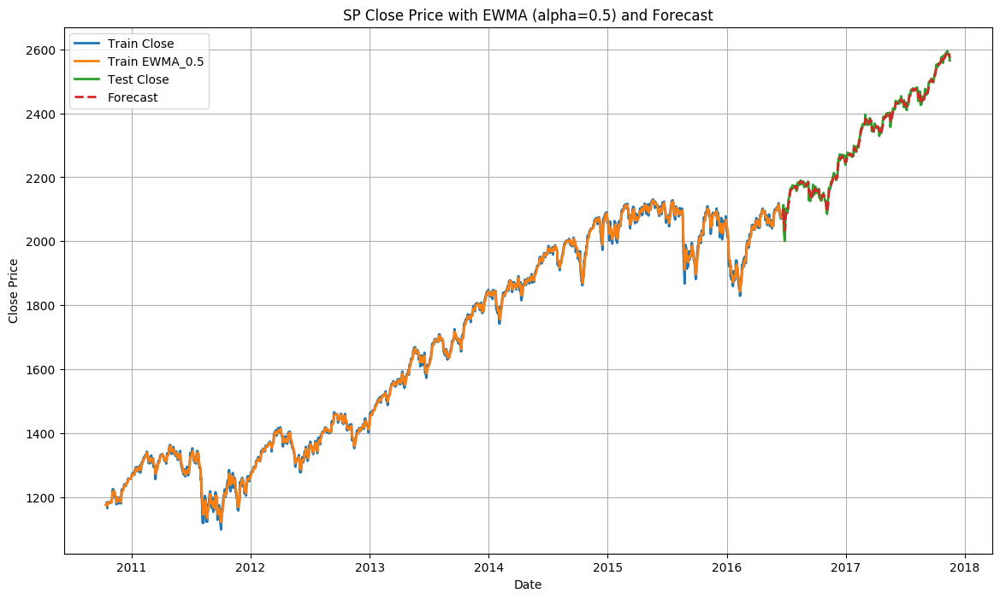

In [24]:
# Create an empty DataFrame to store the R-squared and MSE values
metrics_ewm = pd.DataFrame(index=['DJI', 'NDQ', 'NYSE', 'RUS', 'SP'])

# Perform forecasts using different alpha values and stock exchange data
alpha_values = [0.1, 0.3, 0.5]
stock_exchanges = {
    'DJI': DJI,
    'NDQ': NDQ,
    'NYSE': NYSE,
    'RUS': RUS,
    'SP': SP
}

for stock_name, stock_df in stock_exchanges.items():
    for alpha in alpha_values:
        forecast_using_ewma(stock_name, stock_df, alpha)

In [ ]:
metrics_ewm

,R2_EWMA_0.1,MSE_EWMA_0.1,MAE_EWMA_0.1,MAPE_EWMA_0.1,RMSE_EWMA_0.1,R2_EWMA_0.3,MSE_EWMA_0.3,MAE_EWMA_0.3,MAPE_EWMA_0.3,RMSE_EWMA_0.3,R2_EWMA_0.5,MSE_EWMA_0.5,MAE_EWMA_0.5,MAPE_EWMA_0.5,RMSE_EWMA_0.5
DJI,-1.418126,7.243427e+06,2127.892752,9.984539,2691.361566,-1.407782,7.212443e+06,2121.834384,9.955040,2685.599183,-1.421896,7.254720e+06,2129.321098,9.990930,2693.458722
NDQ,-1.638851,9.047827e+05,780.967935,12.892634,951.200661,-1.632892,9.027394e+05,780.028266,12.877208,950.126015,-1.632087,9.024636e+05,779.889352,12.874880,949.980837
NYSE,-1.633828,1.025196e+06,824.492715,7.061983,1012.519654,-1.574296,1.002024e+06,812.061335,6.952983,1001.011340,-1.604700,1.013858e+06,817.994971,7.004637,1006.905227
RUS,-2.896925,4.821198e+04,191.820684,13.870094,219.572263,-2.875567,4.794774e+04,191.125891,13.817477,218.969732,-2.894190,4.817815e+04,191.670396,13.857941,219.495214
SP,-1.742035,6.714807e+04,211.710588,8.809159,259.129440,-1.727152,6.678360e+04,210.955586,8.776798,258.425235,-1.746086,6.724729e+04,211.858908,8.815215,259.320817


## Auto Regression

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from statsmodels.tsa.ar_model import AutoReg

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def forecast_using_autoreg(stock_name, df, lag):
    # Split the data into train (80%) and test (20%) sets
    train_size = int(len(df) * 0.8)
    train = df['Close'].iloc[:train_size]
    test = df['Close'].iloc[train_size:]

    # Fit an Auto Regression model with the specified lag
    model = AutoReg(train, lags=lag)
    model_fit = model.fit()

    train_forecasts = model_fit.predict(start=lag, end=train_size-1, dynamic=False)

    # Forecast the test data
    test_forecasts = model_fit.predict(start=train_size, end=train_size + len(test) - 1, dynamic=True)

    # Calculate R-squared, Mean Squared Error, Mean Absolute Error, Mean Absolute Percentage Error, and Root Mean Squared Error
    r_squared = r2_score(test, test_forecasts)
    mse = mean_squared_error(test, test_forecasts)
    mae = mean_absolute_error(test, test_forecasts)
    mape = mean_absolute_percentage_error(test.values, test_forecasts)
    rmse = np.sqrt(mse)

    # Update the metrics DataFrame
    metrics_ar.loc[stock_name, f'R2_AR_{lag}'] = r_squared
    metrics_ar.loc[stock_name, f'MSE_AR_{lag}'] = mse
    metrics_ar.loc[stock_name, f'MAE_AR_{lag}'] = mae
    metrics_ar.loc[stock_name, f'MAPE_AR_{lag}'] = mape
    metrics_ar.loc[stock_name, f'RMSE_AR_{lag}'] = rmse

    # Plot the Close and Forecast for the train and test data
    plt.figure(figsize=(14, 8))
    plt.plot(train, label='Train Close', linewidth=2)
    plt.plot(train.index[lag:], train_forecasts, label='Train Forecast', linestyle='--', linewidth=2)
    plt.plot(test.index, test, label='Test Close', linewidth=2)
    plt.plot(test.index, test_forecasts, label='Test Forecast', linestyle='--', linewidth=2)

    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'{stock_name} Close Price with Auto Regression (lag={lag}) and Forecast')
    plt.legend()
    plt.grid()
    plt.show()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


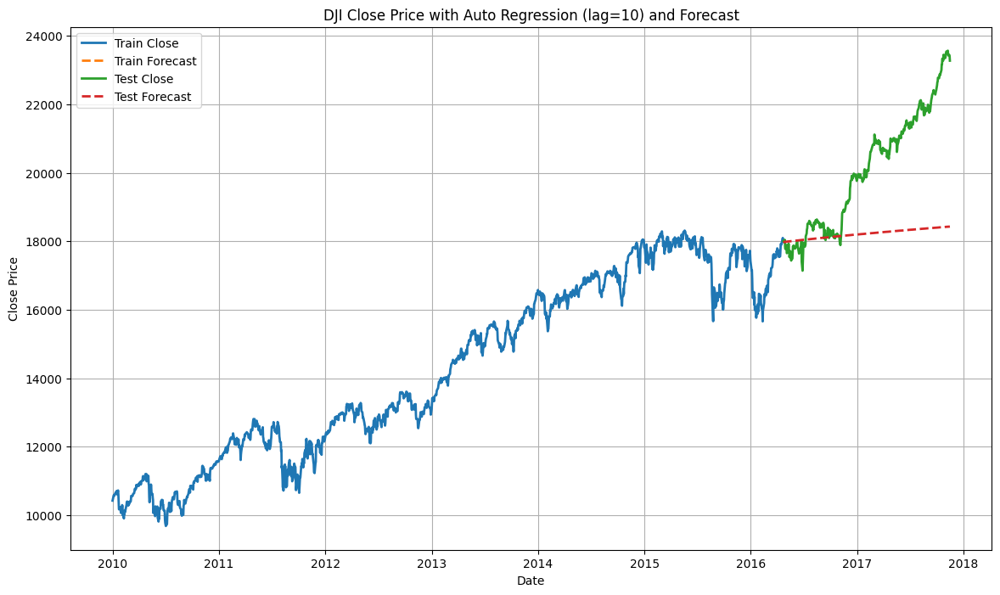

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


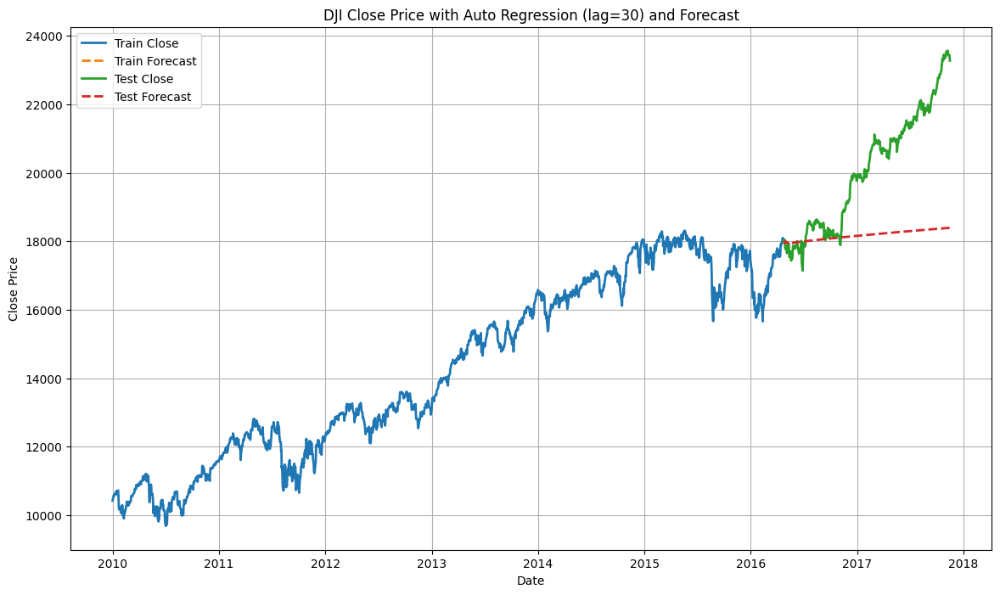

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


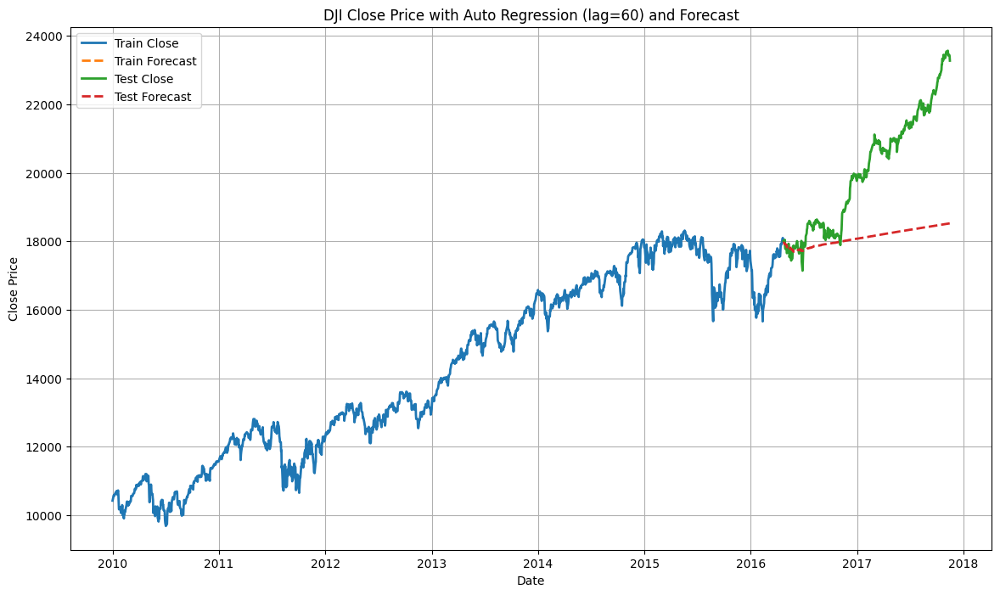

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


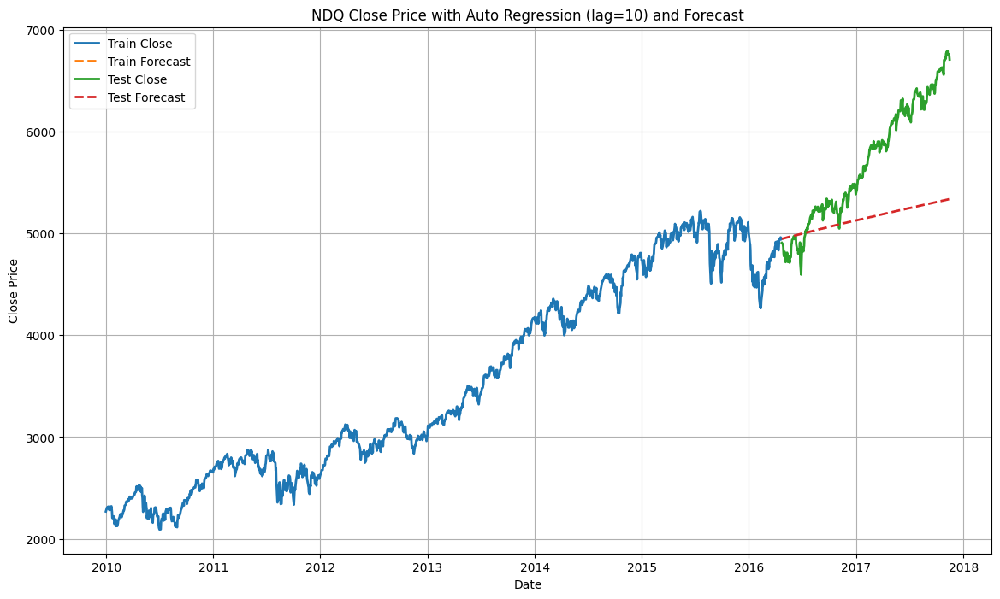

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


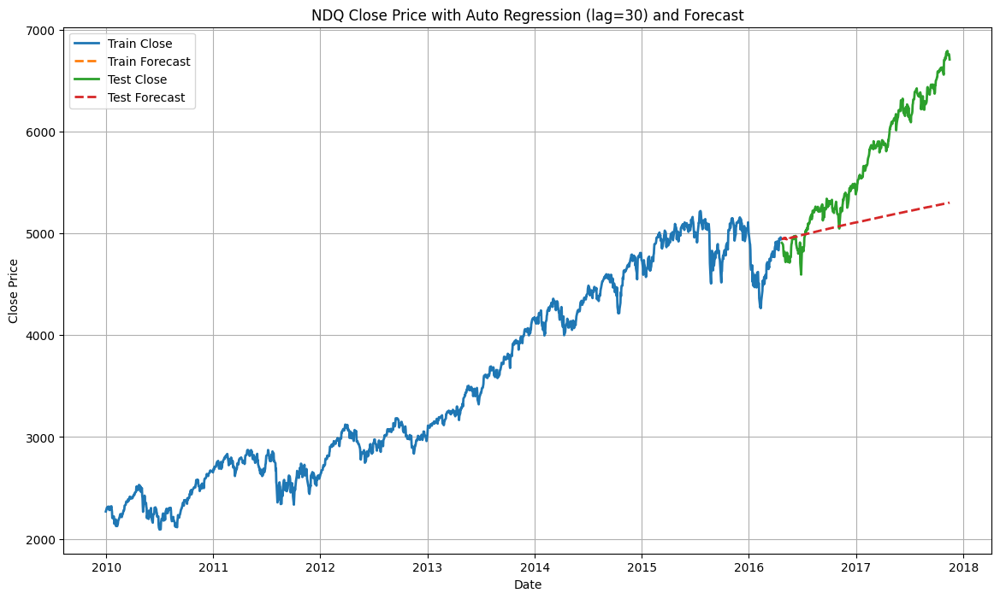

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


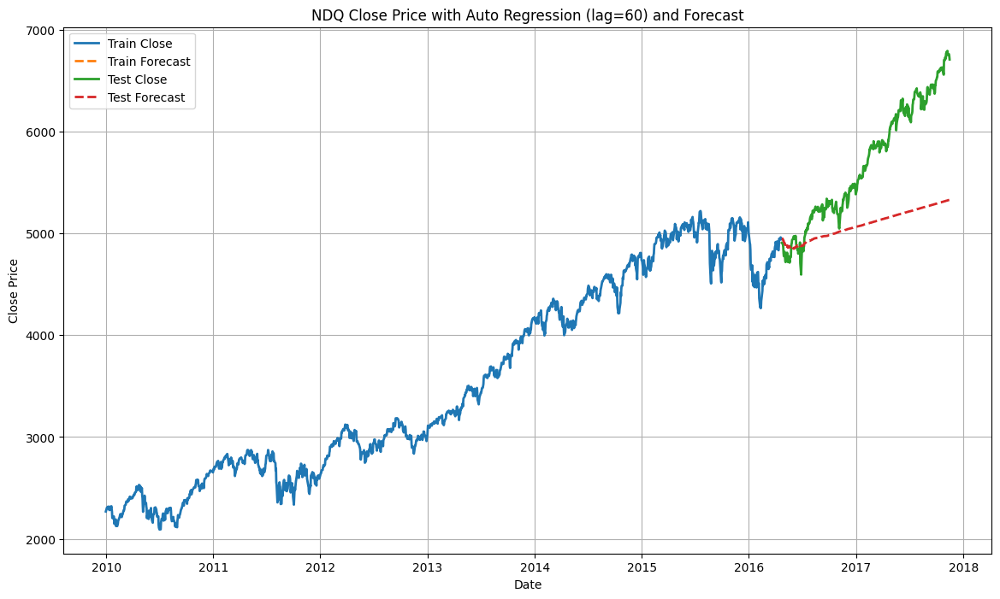

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


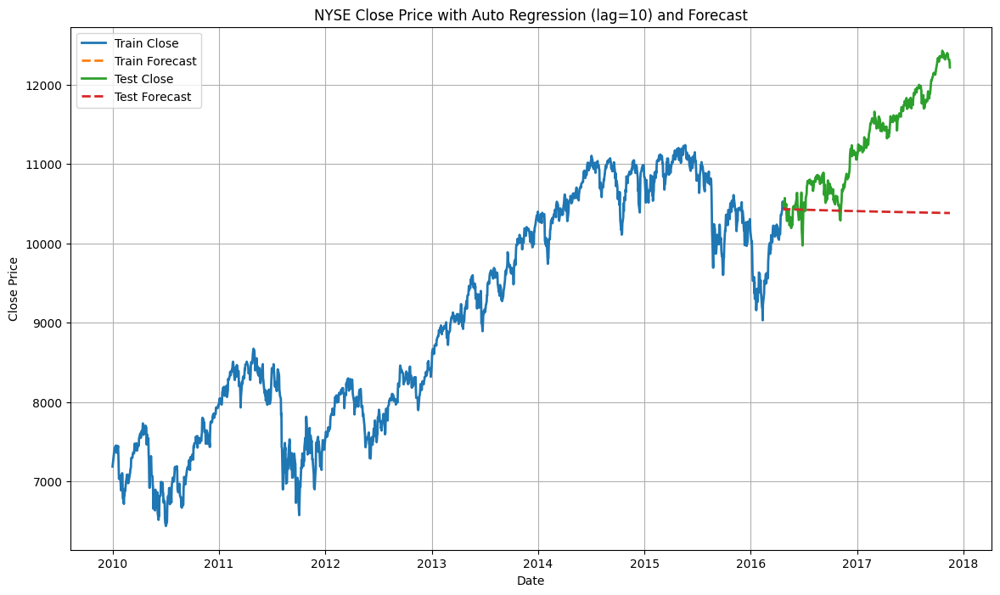

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


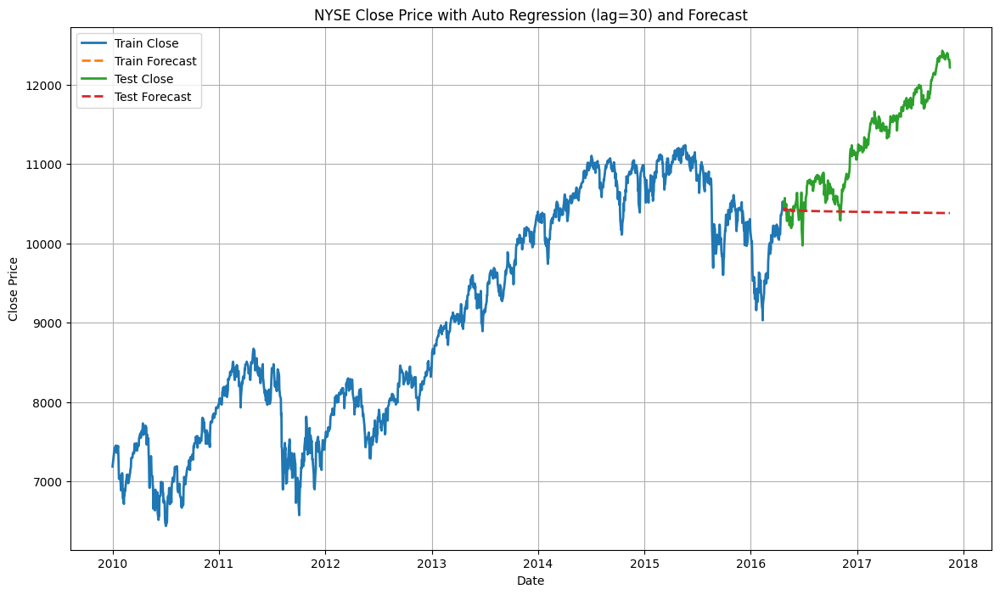

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


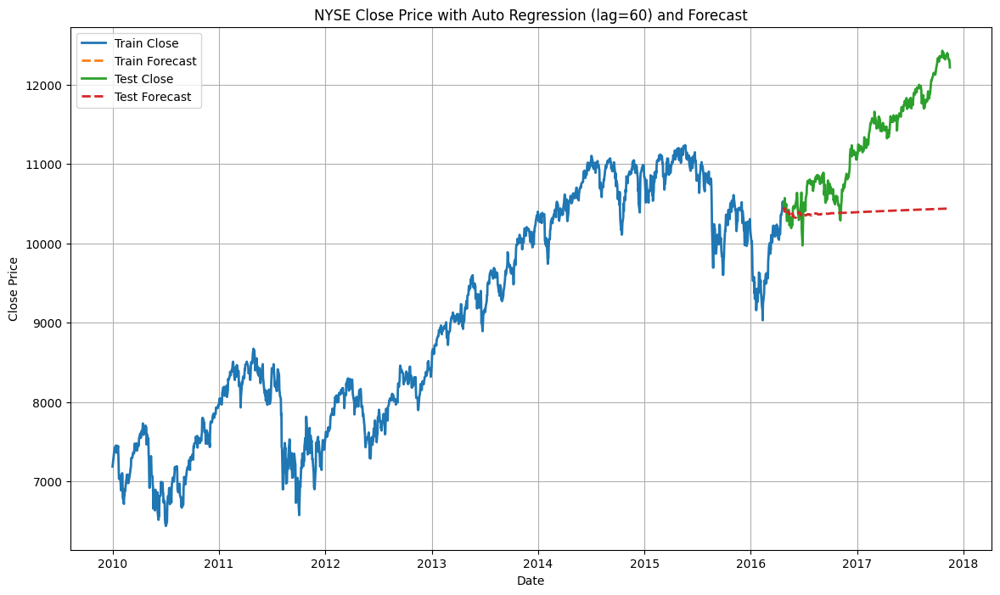

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


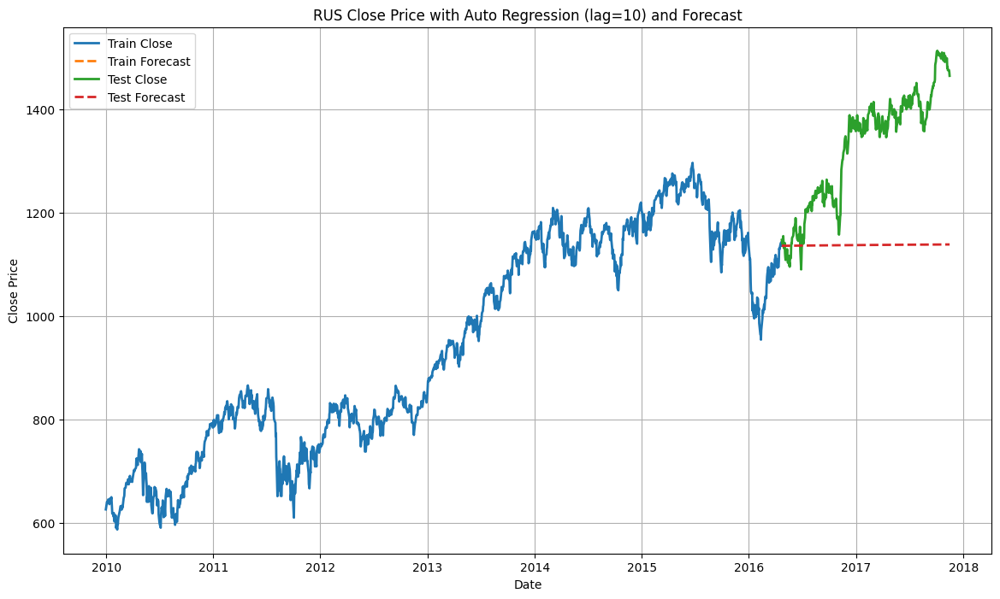

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


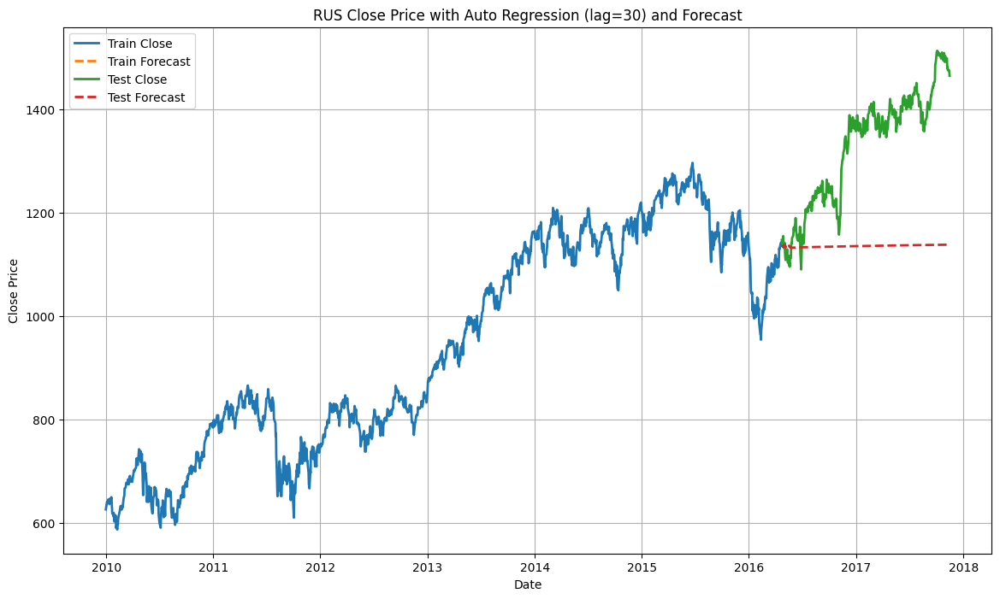

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


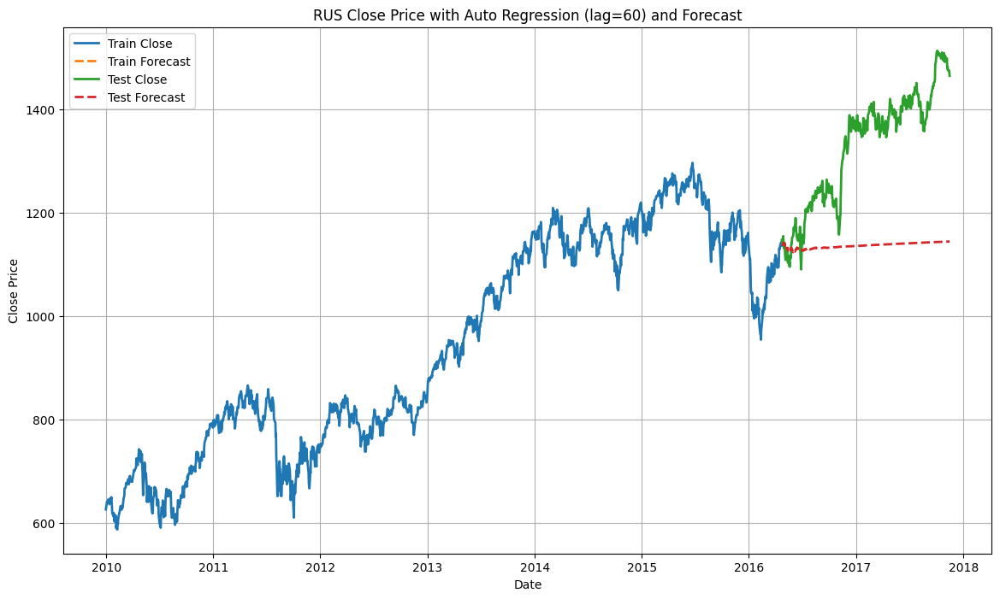

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


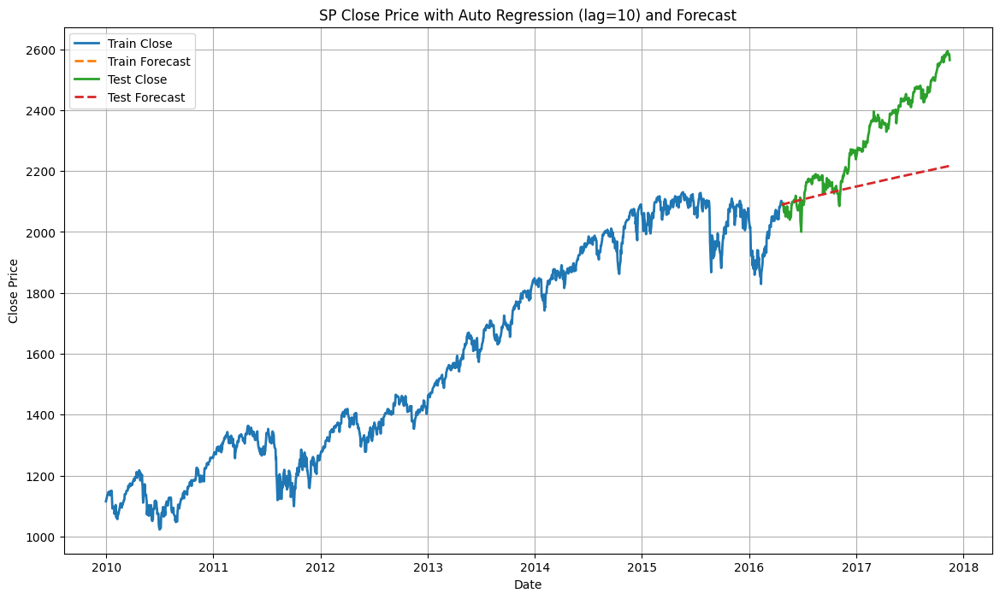

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


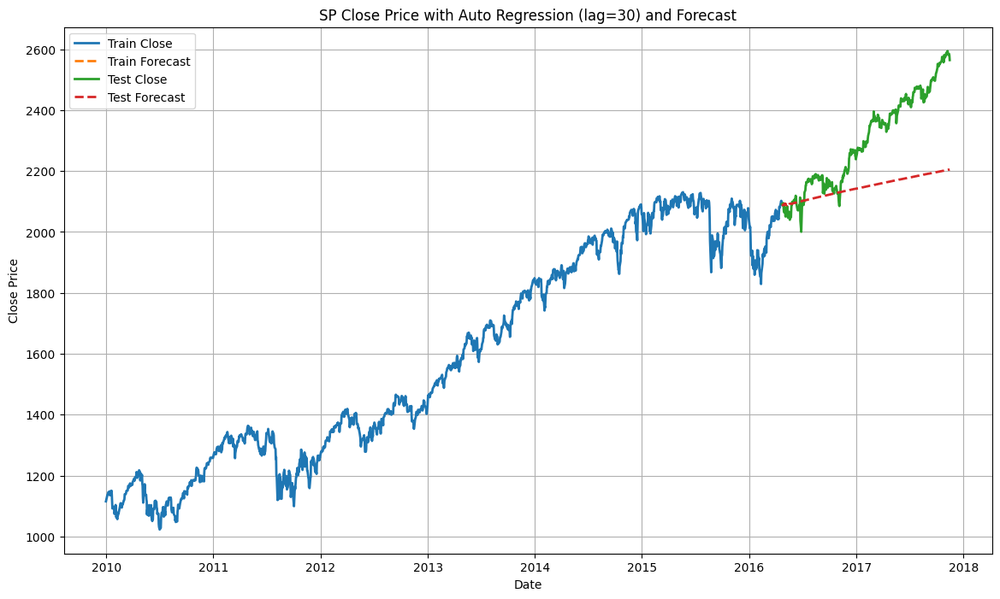

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


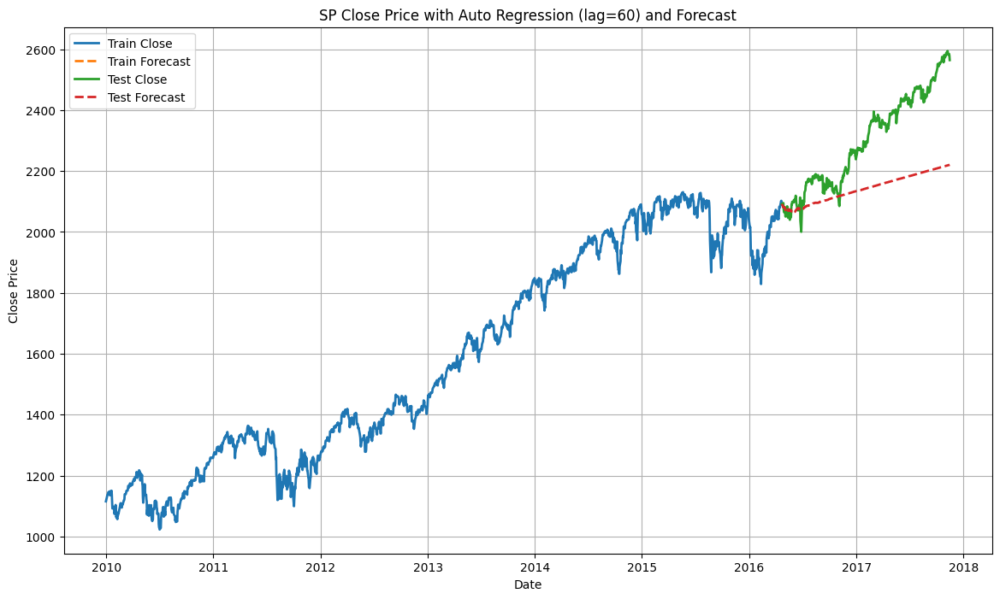

In [ ]:
# Create an empty DataFrame to store the R-squared and MSE values
metrics_ar = pd.DataFrame(index=['DJI', 'NDQ', 'NYSE', 'RUS', 'SP'])

# Perform forecasts using different lag values and stock exchange data
lag_values = [10, 30, 60]
stock_exchanges = {
    'DJI': DJI,
    'NDQ': NDQ,
    'NYSE': NYSE,
    'RUS': RUS,
    'SP': SP
}

for stock_name, stock_df in stock_exchanges.items():
    for lag in lag_values:
        forecast_using_autoreg(stock_name, stock_df, lag)

In [ ]:
metrics_ar

,R2_AR_10,MSE_AR_10,MAE_AR_10,MAPE_AR_10,RMSE_AR_10,R2_AR_30,MSE_AR_30,MAE_AR_30,MAPE_AR_30,RMSE_AR_30,R2_AR_60,MSE_AR_60,MAE_AR_60,MAPE_AR_60,RMSE_AR_60
DJI,-1.000259,5.991720e+06,1921.208917,9.004743,2447.798940,-1.047398,6.132923e+06,1948.875977,9.137347,2476.473868,-1.013920,6.032641e+06,1968.427034,9.256233,2456.143549
NDQ,-0.533657,5.258450e+05,587.291884,9.681638,725.151690,-0.624720,5.570677e+05,606.087316,9.993495,746.369697,-0.651561,5.662706e+05,622.769177,10.296439,752.509534
NYSE,-1.909481,1.132491e+06,872.462453,7.477515,1064.185778,-1.932647,1.141509e+06,878.769920,7.534110,1068.414171,-1.820499,1.097856e+06,871.671955,7.482690,1047.786261
RUS,-2.883701,4.804838e+04,191.605322,13.855774,219.199397,-2.926021,4.857195e+04,193.195937,13.978382,220.390448,-2.846089,4.758305e+04,191.847963,13.889509,218.135387
SP,-0.449445,3.549459e+04,151.539798,6.295578,188.400088,-0.563239,3.828123e+04,158.027919,6.567579,195.655899,-0.526070,3.737103e+04,160.112320,6.675736,193.315889


## ARIMA

In [4]:
def pre_process(df):
  df.drop('Name',inplace=True,axis=1)
  df=df.fillna(method = 'ffill')
  df=df.fillna(method = 'bfill')
  df=df.dropna()
  df["Date"] = pd.to_datetime(df["Date"])
  df.set_index("Date", inplace=True)
  return df

In [5]:
DJI = pre_process(DJI)
NDQ = pre_process(NDQ)
NYSE = pre_process(NYSE)
RUS = pre_process(RUS)
SP = pre_process(SP)

In [14]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from statsmodels.tsa.arima.model import ARIMA

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def forecast_using_arima(stock_name, df, order, n_lags):
    # Split the data into train (80%) and test (20%) sets
    lag_df = create_lag_features_all(df, n_lags)
    train_size = int(len(lag_df) * 0.8)
    train = lag_df['Close'].iloc[:train_size]
    test = lag_df['Close'].iloc[train_size:]

    # Fit an ARIMA model with the specified order
    model = ARIMA(train, order=order)
    model_fit = model.fit()

    # Forecast the train data
    trained_forecasts = model_fit.predict(start=order[1], end=train_size - 1)

    # Forecast the test data
    forecasts = model_fit.predict(start=train_size, end=train_size + len(test) - 1, dynamic=True)

    # Calculate R-squared, Mean Squared Error, Mean Absolute Error, and Mean Absolute Percentage Error
    r_squared = r2_score(test, forecasts)
    mse = mean_squared_error(test, forecasts)
    mae = mean_absolute_error(test, forecasts)
    mape = mean_absolute_percentage_error(test.values, forecasts)
    rmse = np.sqrt(mse)

    # Update the metrics DataFrame
    metrics_arima.loc[stock_name, f'R2_ARIMA_n_lags = {n_lags}'] = r_squared
    metrics_arima.loc[stock_name, f'MSE_ARIMA_n_lags = {n_lags}'] = mse
    metrics_arima.loc[stock_name, f'MAE_ARIMA_n_lags = {n_lags}'] = mae
    metrics_arima.loc[stock_name, f'MAPE_ARIMA_n_lags = {n_lags}'] = mape
    metrics_arima.loc[stock_name, f'RMSE_ARIMA_n_lags = {n_lags}'] = rmse

    # Plot the Close for the train and test data, the trained_forecasts, and the forecasts for the test data
    plt.figure(figsize=(14, 8))
    plt.plot(train, label='Train Close', linewidth=2)
    plt.plot(train.index[order[1]:], trained_forecasts, label='Train Forecast', linestyle='--', linewidth=2)
    plt.plot(test.index, test, label='Test Close', linewidth=2)
    plt.plot(test.index, forecasts, label='Test Forecast', linestyle='--', linewidth=2)

    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'{stock_name} Close Price with ARIMA (n_lags={n_lags}) and Forecast')
    plt.legend()
    plt.grid()
    plt.show()


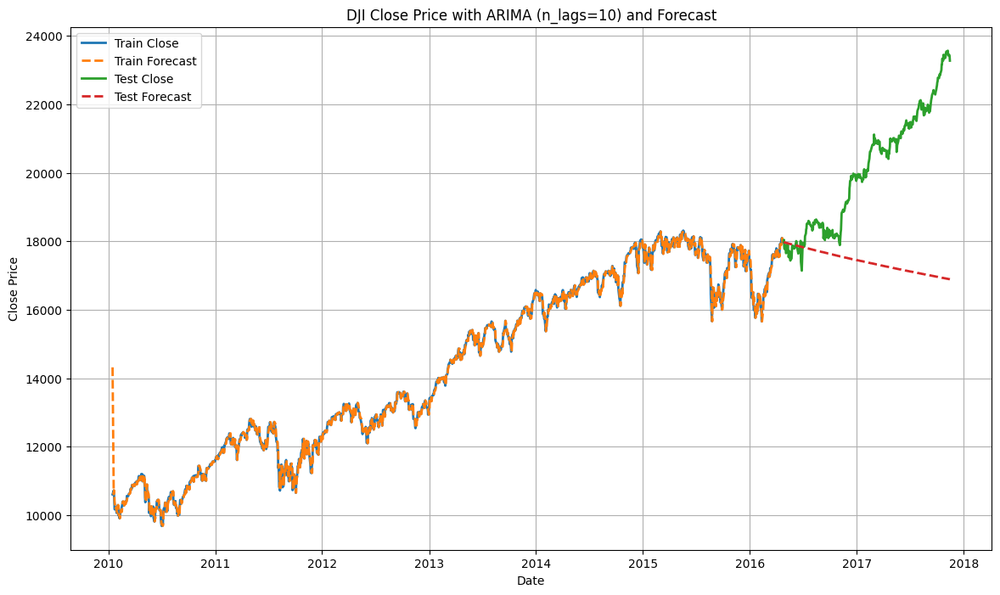

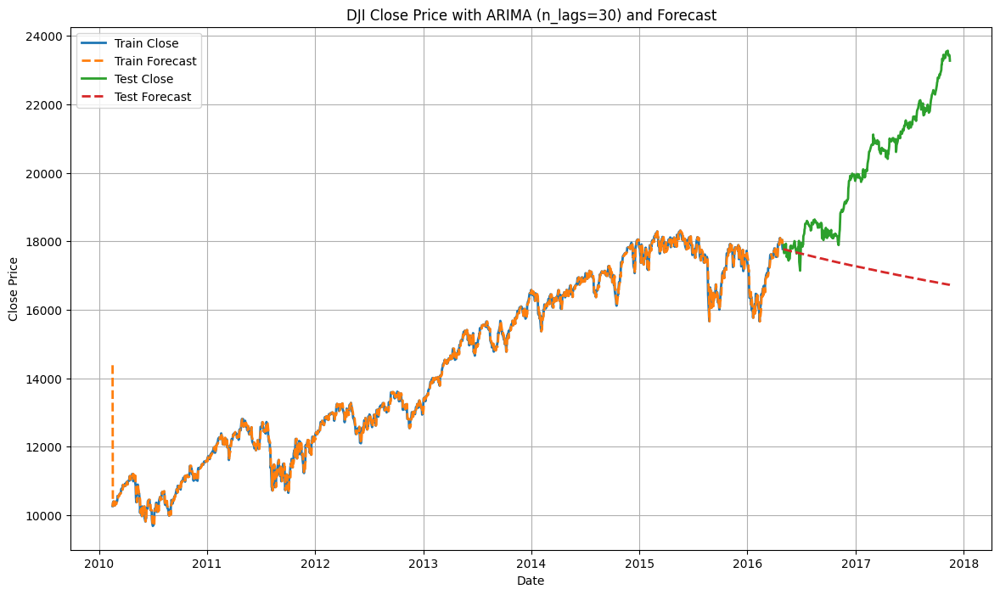

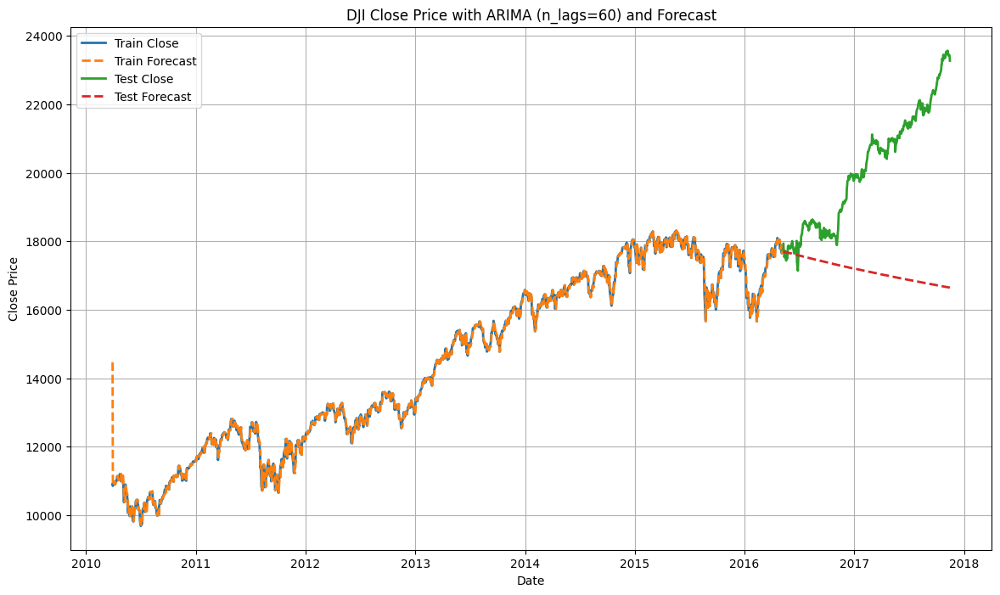

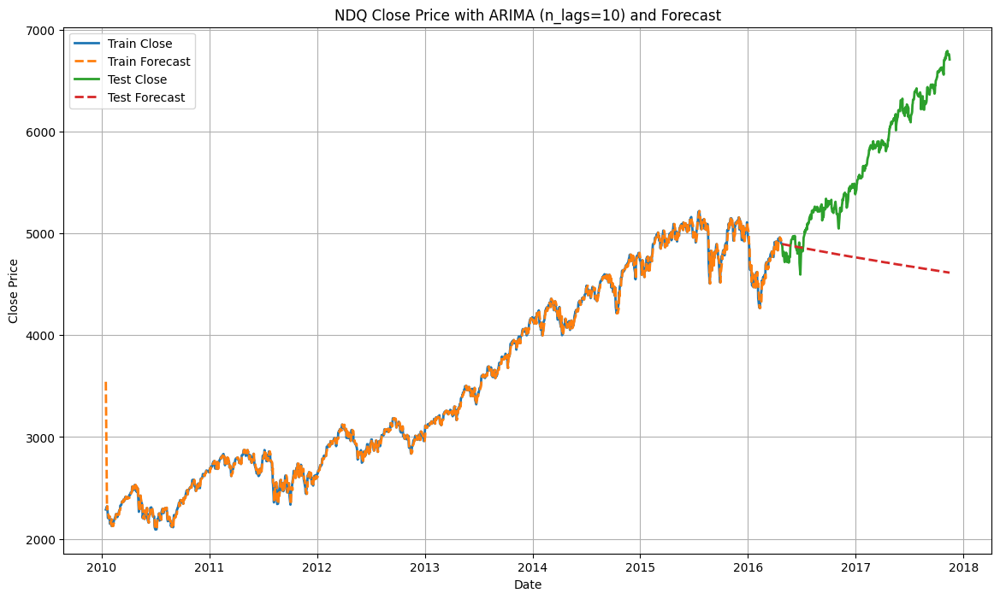

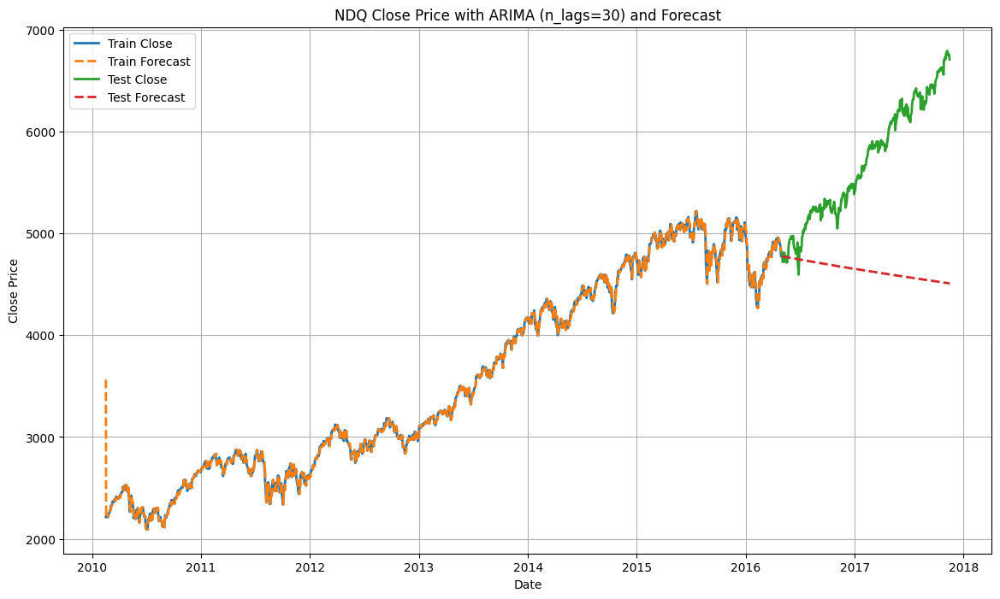

...

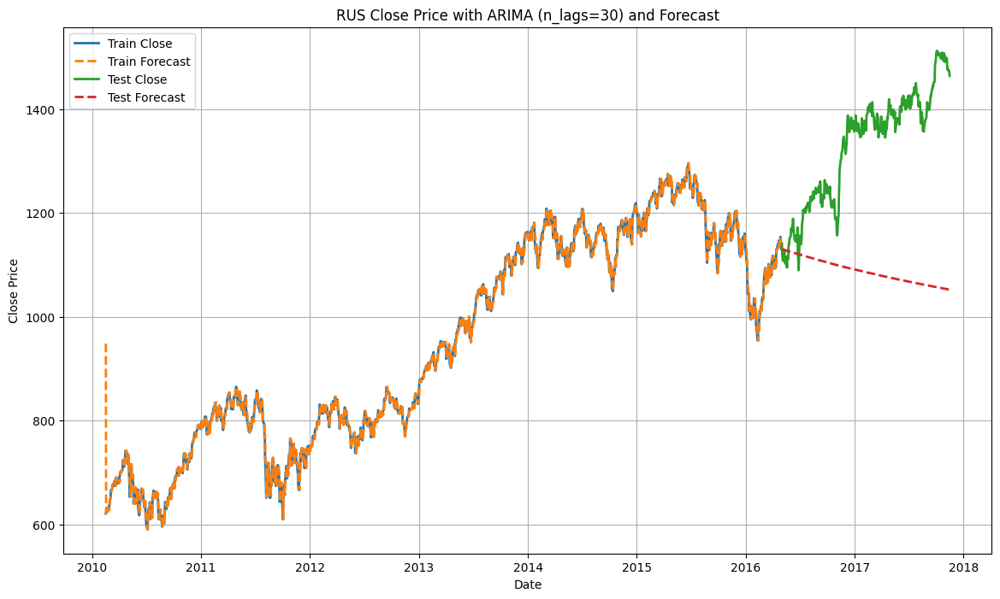

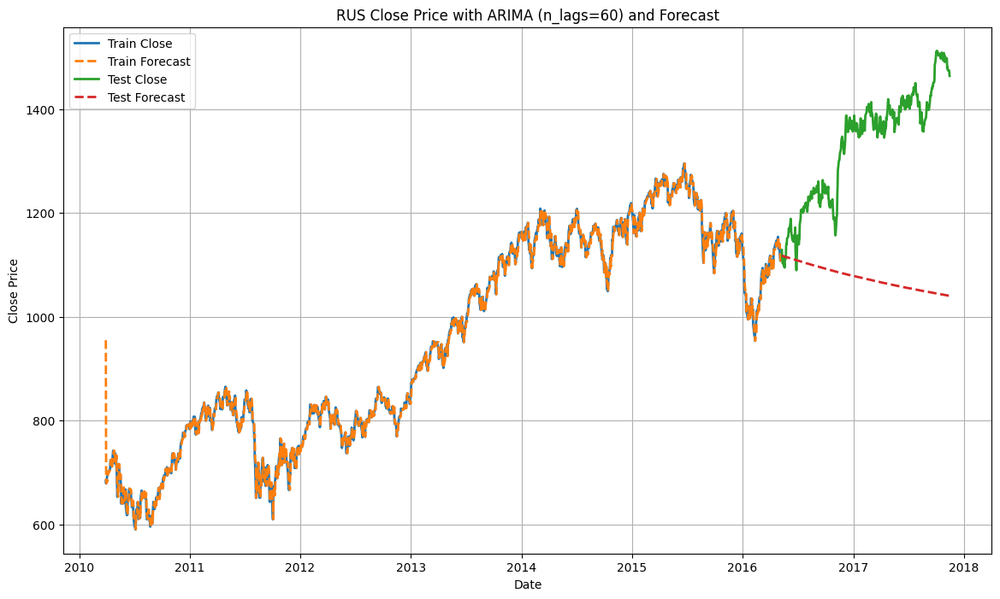

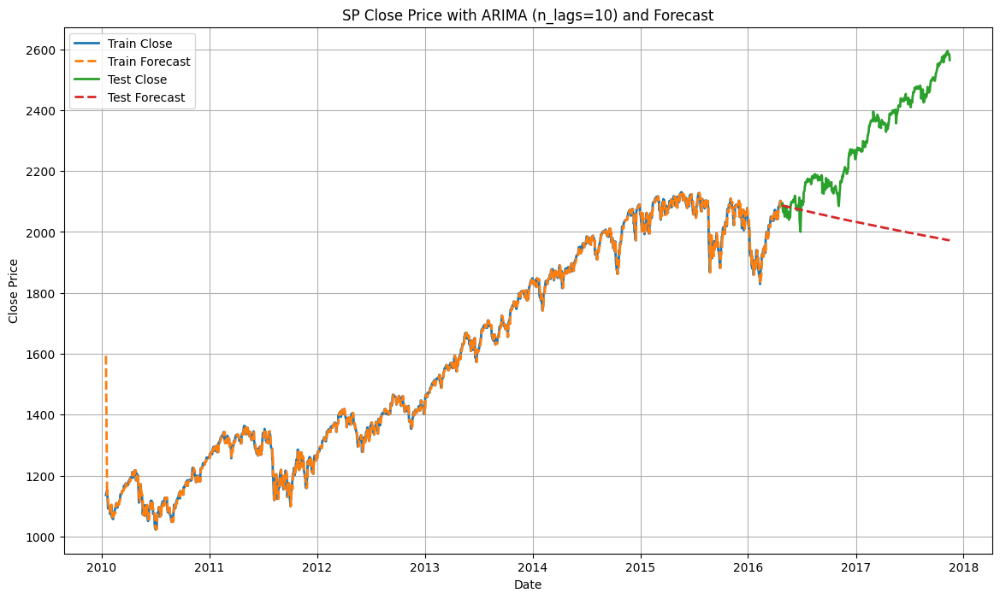

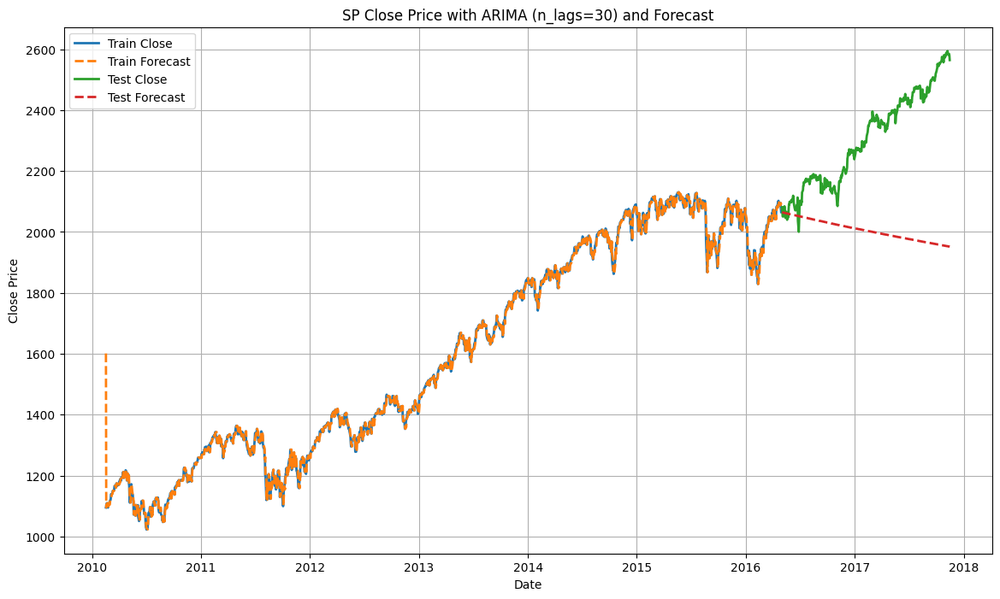

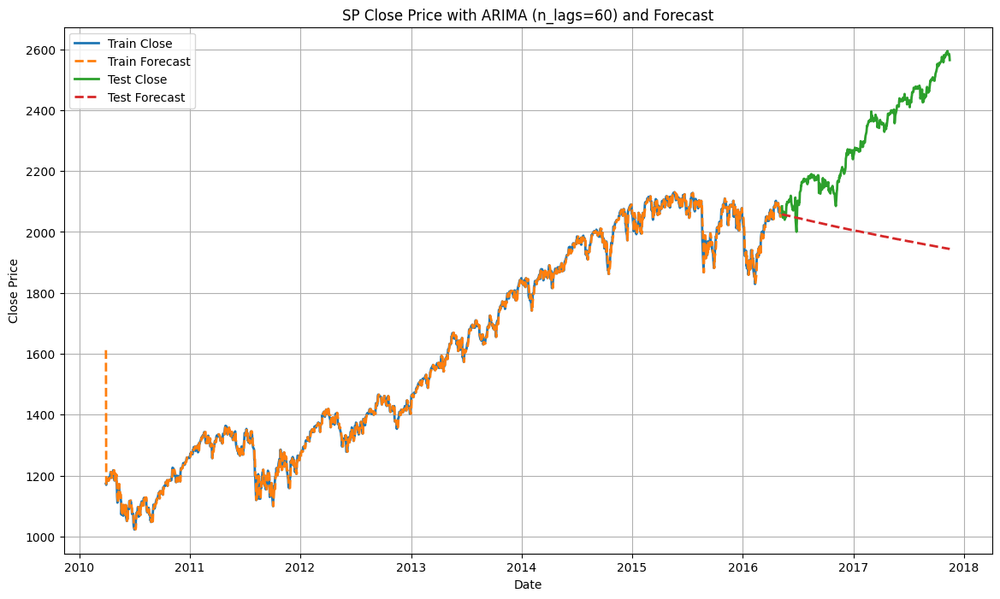

In [15]:
# Create an empty DataFrame to store the R-squared and MSE values
import warnings
warnings.filterwarnings("ignore")
metrics_arima = pd.DataFrame(index=['DJI', 'NDQ', 'NYSE', 'RUS', 'SP'])

# Perform forecasts using different order values and stock exchange data
order = (1, 0, 0)
n_lag_values = [10,30,60]
stock_exchanges = {
    'DJI': DJI,
    'NDQ': NDQ,
    'NYSE': NYSE,
    'RUS': RUS,
    'SP': SP
}

for stock_name, stock_df in stock_exchanges.items():
    for n_lags in n_lag_values:
        forecast_using_arima(stock_name, stock_df, order, n_lags)

In [16]:
metrics_arima

,R2_ARIMA_n_lags = 10,MSE_ARIMA_n_lags = 10,MAE_ARIMA_n_lags = 10,MAPE_ARIMA_n_lags = 10,RMSE_ARIMA_n_lags = 10,R2_ARIMA_n_lags = 30,MSE_ARIMA_n_lags = 30,MAE_ARIMA_n_lags = 30,MAPE_ARIMA_n_lags = 30,RMSE_ARIMA_n_lags = 30,R2_ARIMA_n_lags = 60,MSE_ARIMA_n_lags = 60,MAE_ARIMA_n_lags = 60,MAPE_ARIMA_n_lags = 60,RMSE_ARIMA_n_lags = 60
DJI,-2.778718,1.129357e+07,2716.552581,12.787972,3360.591282,-3.165188,1.237338e+07,2895.467254,13.661670,3517.580847,-3.441636,1.300677e+07,3004.873099,14.189515,3606.489318
NDQ,-2.933841,1.343026e+06,966.515704,15.987915,1158.889870,-3.682448,1.578625e+06,1074.401763,17.847582,1256.433392,-4.096553,1.671274e+06,1118.184756,18.590714,1292.777568
NYSE,-4.558979,2.158000e+06,1228.911256,10.553507,1469.013169,-4.612287,2.167490e+06,1239.554074,10.646453,1472.239881,-5.484106,2.453755e+06,1354.713186,11.662176,1566.446654
RUS,-5.028877,7.392998e+04,238.421263,17.243444,271.900677,-5.255510,7.532391e+04,242.598976,17.554994,274.452016,-6.166273,8.264826e+04,257.650672,18.666149,287.486103
SP,-3.532416,1.105325e+05,276.790483,11.541979,332.464319,-4.123419,1.236728e+05,298.633525,12.479308,351.671406,-4.505253,1.298067e+05,309.298092,12.931090,360.286989


## ARIMAX

Unlike the rest of the statistical methods that we have used so far, ARIMAX allows us to use multiple features to perform time series analysis on one variable. Since the csv files that we are provided with, contain 84 columns (including `Date` and `Close` columns), we will use the rest of the columns to perform forecasting on `Close` column. First we will perform preprocessing to cater for the `Nan` values in the data, and to drop the `Name` column which is redundant.

In [5]:
DJI = pd.read_csv('Processed_DJI.csv')
NDQ = pd.read_csv('Processed_NASDAQ.csv')
NYSE = pd.read_csv('Processed_NYSE.csv')
RUS = pd.read_csv('Processed_RUSSELL.csv')
SP = pd.read_csv('Processed_S&P.csv')

In [6]:
def pre_process(dataframe):
  dataframe.drop('Name',inplace=True,axis=1)
  dataframe=dataframe.fillna(method = 'ffill')
  dataframe=dataframe.dropna()
  dataframe["Date"] = pd.to_datetime(dataframe["Date"])
  dataframe.set_index("Date", inplace=True)
  return dataframe

In [7]:
DJI = pre_process(DJI)
NDQ = pre_process(NDQ)
NYSE = pre_process(NYSE)
RUS = pre_process(RUS)
SP = pre_process(SP)

In [24]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from statsmodels.tsa.arima.model import ARIMA

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def forecast_using_arimax(stock_name, df, order, n_lags):
    # Split the data into train (80%) and test (20%) sets
    df1 = df.copy()
    lag_df = create_lag_features_all(df1, n_lags)
    train_size = int(len(lag_df) * 0.8)
    train = lag_df.iloc[:train_size]
    test = lag_df.iloc[train_size:]

    # Separate the Close and exogenous columns
    train_close = train['Close']
    train_exog = train.drop('Close', axis=1)
    test_close = test['Close']
    test_exog = test.drop('Close', axis=1)

    # Fit an ARIMAX model with the specified order and exogenous variables
    model = ARIMA(train_close, order=order, exog=train_exog)
    model_fit = model.fit()

    train_forecasts = model_fit.predict(start=order[1], end=train_size - 1, exog=train_exog, dynamic=False)

    # Forecast the test data
    test_forecasts = model_fit.predict(start=train_size, end=train_size + len(test) - 1, exog=test_exog, dynamic=True)

    # Calculate R-squared, Mean Squared Error, Mean Absolute Error, Mean Absolute Percentage Error, and Root Mean Squared Error
    r_squared = r2_score(test_close, test_forecasts)
    mse = mean_squared_error(test_close, test_forecasts)
    mae = mean_absolute_error(test_close, test_forecasts)
    mape = mean_absolute_percentage_error(test_close.values, test_forecasts)
    rmse = np.sqrt(mse)

    # Update the metrics DataFrame
    metrics_arimax.loc[stock_name, f'R2_ARIMAX_n_lags = {n_lags}'] = r_squared
    metrics_arimax.loc[stock_name, f'MSE_ARIMAX_n_lags = {n_lags}'] = mse
    metrics_arimax.loc[stock_name, f'MAE_ARIMAX_n_lags = {n_lags}'] = mae
    metrics_arimax.loc[stock_name, f'MAPE_ARIMAX_n_lags = {n_lags}'] = mape
    metrics_arimax.loc[stock_name, f'RMSE_ARIMAX_n_lags = {n_lags}'] = rmse

    # Plot the Close and Forecast for the train and test data
    plt.figure(figsize=(14, 8))
    plt.plot(train_close, label='Train Close', linewidth=2)
    plt.plot(train_close.index[order[1]:], train_forecasts, label='Train Forecast', linestyle='--', linewidth=2)
    plt.plot(test_close.index, test_close, label='Test Close', linewidth=2)
    plt.plot(test_close.index, test_forecasts, label='Test Forecast', linestyle='--', linewidth=2)

    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'{stock_name} Close Price with ARIMAX (n_lags={n_lags}) and Forecast')
    plt.legend()
    plt.grid()
    plt.show()

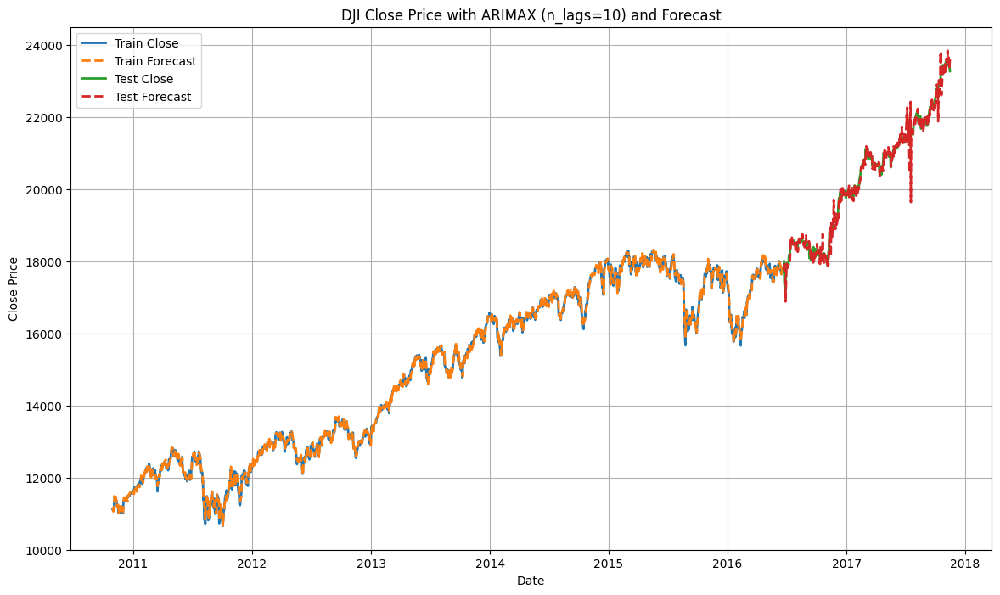

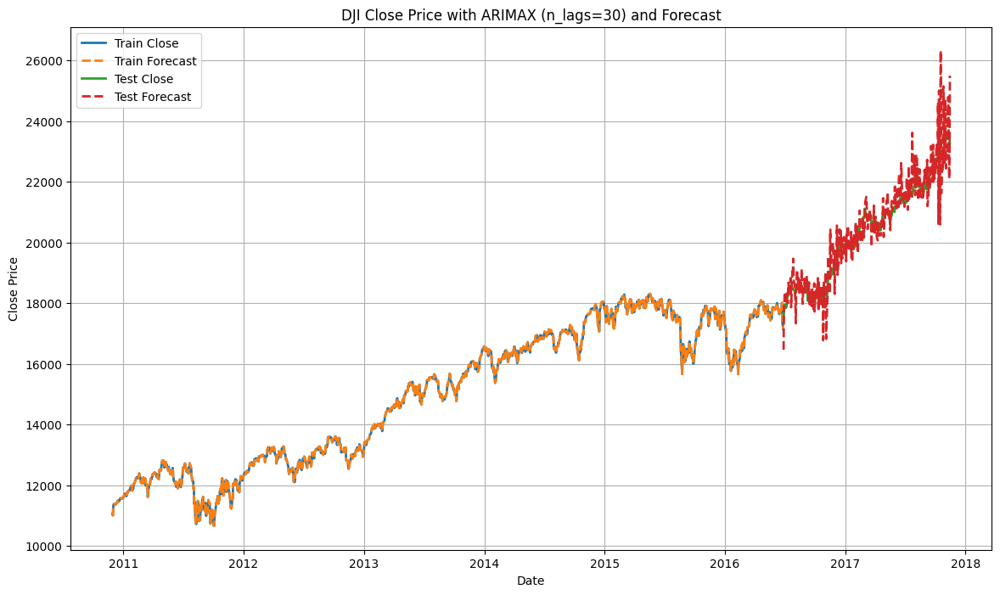

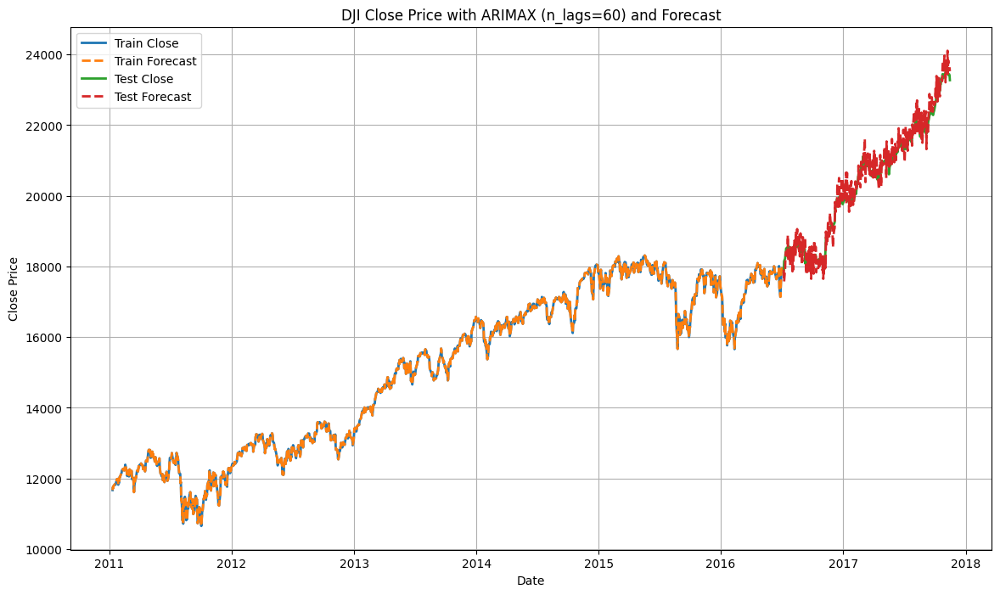

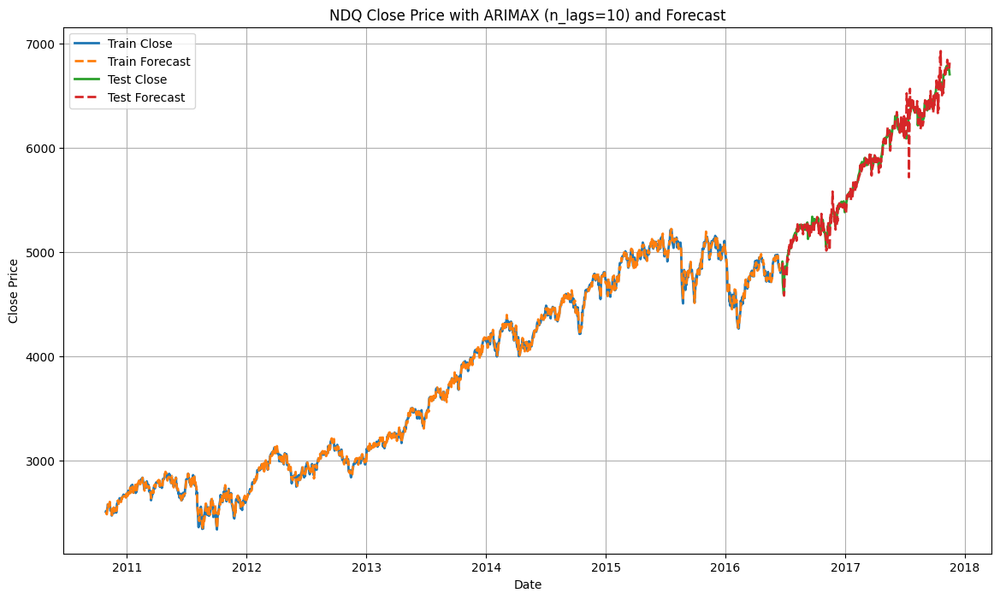

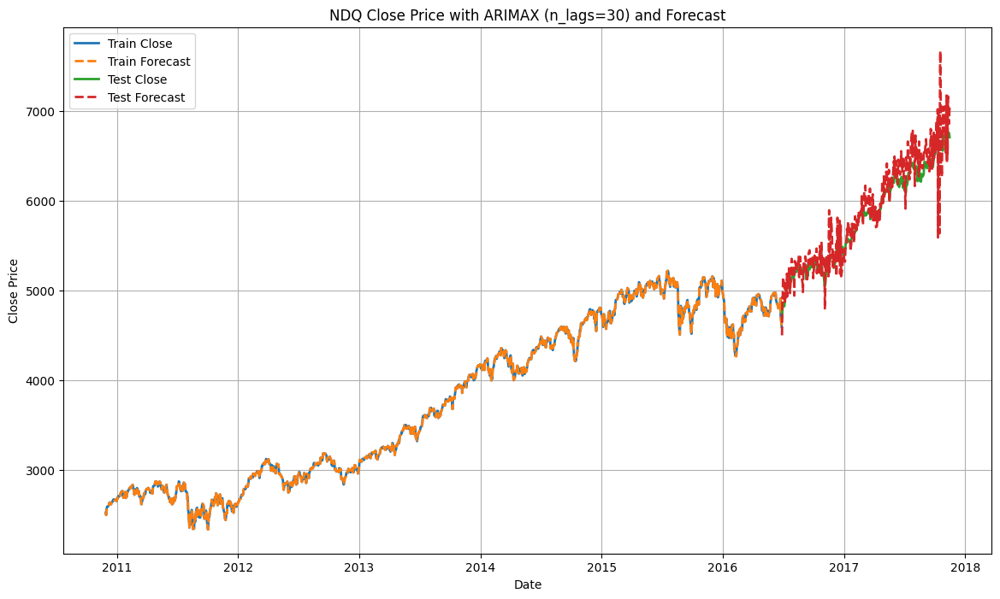

...

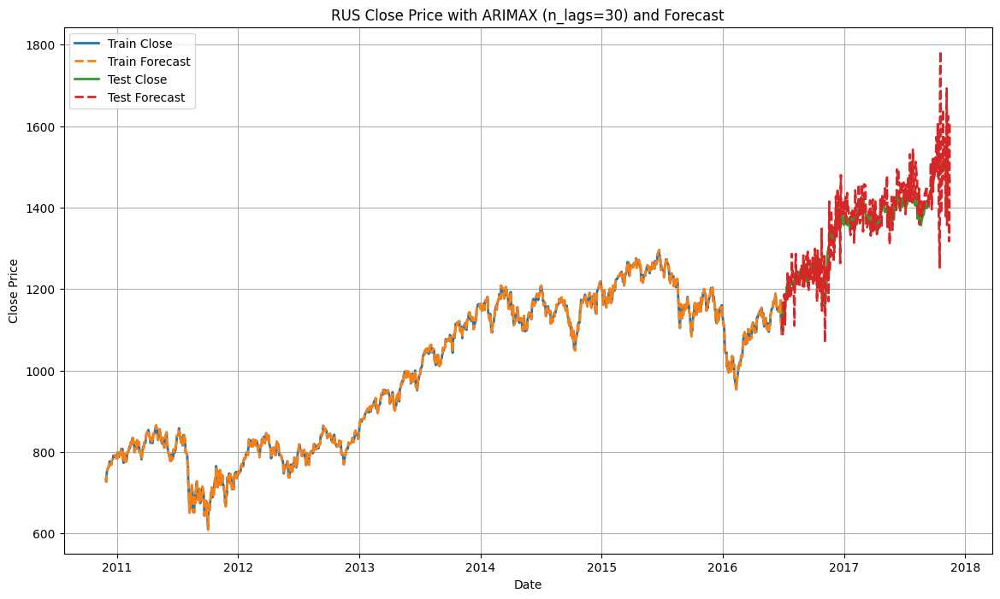

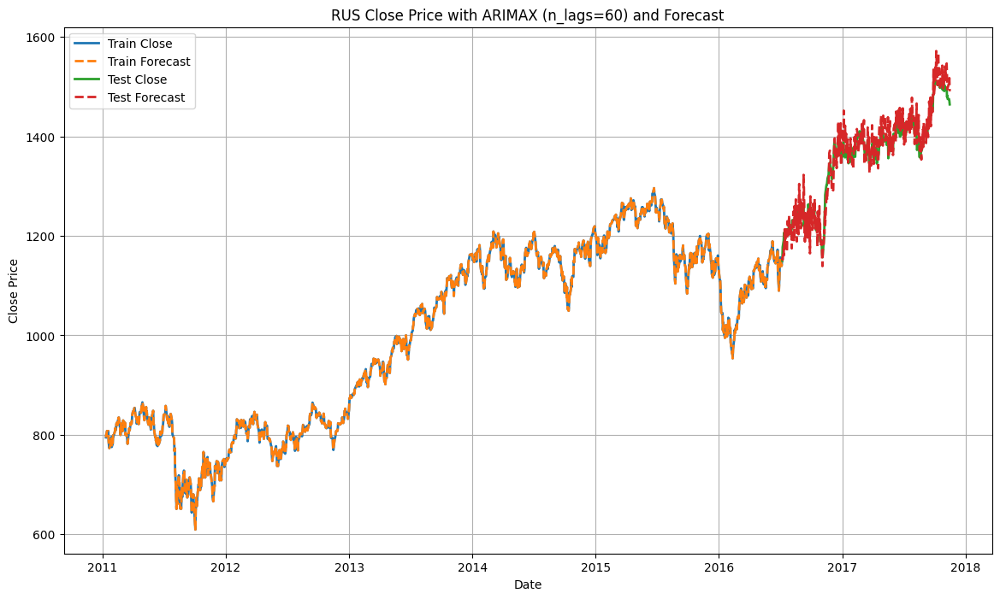

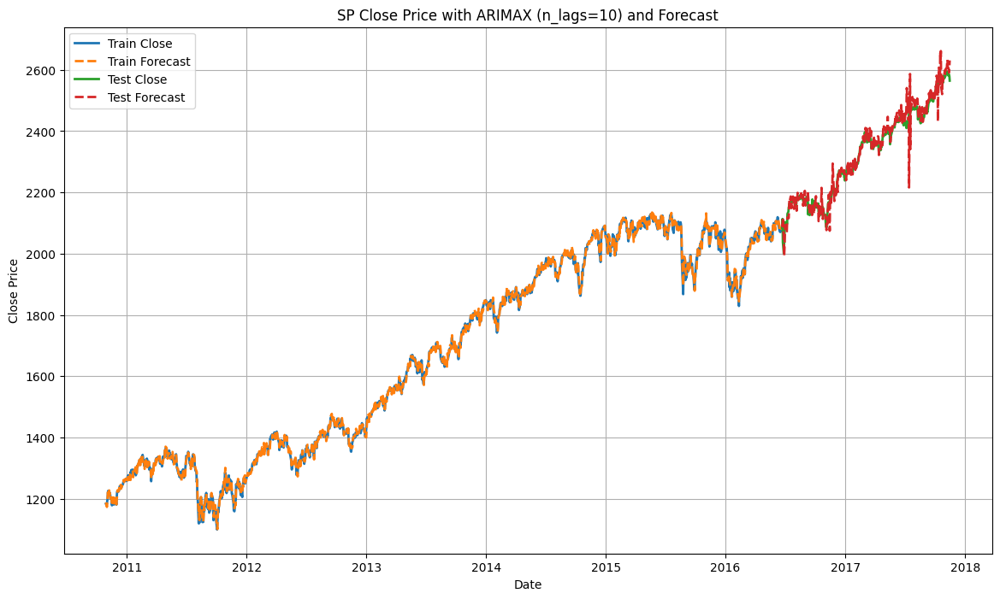

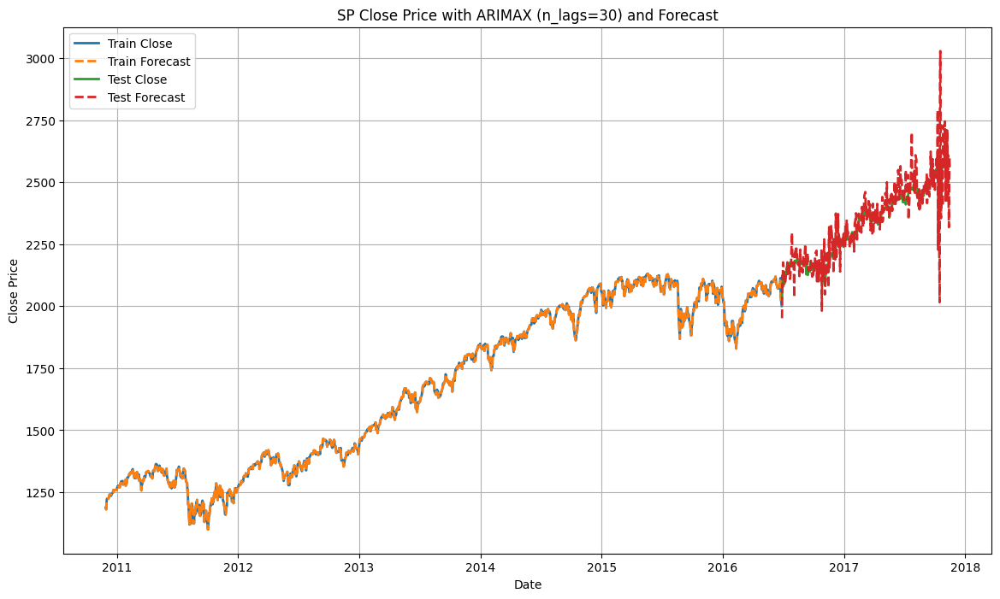

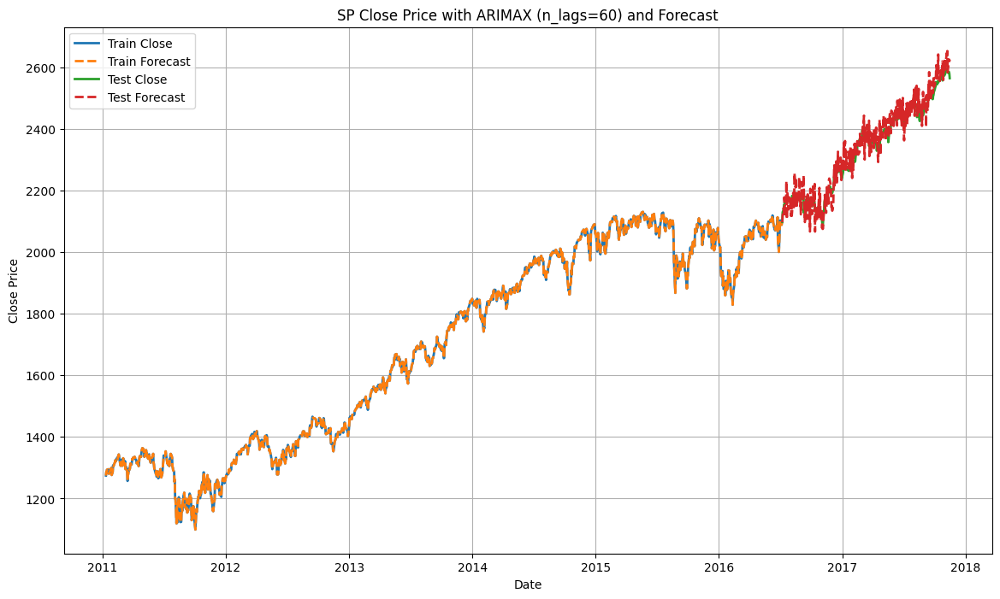

In [25]:
# Create an empty DataFrame to store the R-squared and MSE values
metrics_arimax = pd.DataFrame(index=['DJI', 'NDQ', 'NYSE', 'RUS', 'SP'])

n_lag_values = [10,30,60]

# Perform forecasts using different order values and stock exchange data
order = (1, 0, 0)
stock_exchanges = {
    'DJI': DJI,
    'NDQ': NDQ,
    'NYSE': NYSE,
    'RUS': RUS,
    'SP': SP
}

for stock_name, stock_df in stock_exchanges.items():
    for n_lags in n_lag_values:
        forecast_using_arimax(stock_name, stock_df, order, n_lags)

In [26]:
metrics_arimax

,R2_ARIMAX_n_lags = 10,MSE_ARIMAX_n_lags = 10,MAE_ARIMAX_n_lags = 10,MAPE_ARIMAX_n_lags = 10,RMSE_ARIMAX_n_lags = 10,R2_ARIMAX_n_lags = 30,MSE_ARIMAX_n_lags = 30,MAE_ARIMAX_n_lags = 30,MAPE_ARIMAX_n_lags = 30,RMSE_ARIMAX_n_lags = 30,R2_ARIMAX_n_lags = 60,MSE_ARIMAX_n_lags = 60,MAE_ARIMAX_n_lags = 60,MAPE_ARIMAX_n_lags = 60,RMSE_ARIMAX_n_lags = 60
DJI,0.980411,51929.263983,139.717162,0.686260,227.879933,0.859530,364161.545009,421.944187,2.035026,603.457989,0.966121,85352.655796,231.876920,1.141908,292.151768
NDQ,0.979509,5848.544181,49.469864,0.850632,76.475775,0.848016,41974.061738,150.322697,2.545512,204.875723,0.970866,7670.917601,68.013480,1.185573,87.583775
NYSE,0.890817,36740.527447,129.857118,1.134742,191.678187,0.379439,202982.776731,280.009748,2.431088,450.536099,0.891645,34206.961345,148.907710,1.309514,184.951240
RUS,0.909607,824.810639,17.198724,1.268267,28.719517,0.684922,2738.691798,36.393868,2.662650,52.332512,0.911197,714.537385,21.564251,1.597850,26.730832
SP,0.956831,898.936045,19.211841,0.822446,29.982262,0.726216,5535.125888,46.297984,1.962287,74.398427,0.933775,1290.291841,29.375356,1.264491,35.920633


## SARIMAX

In [10]:
!pip install statsmodels

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 46.7 kB/s eta 0:00:00m eta 0:00:010:00:06m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.8/233.8 kB 72.1 kB/s eta 0:00:00 kB/s eta 0:00:01:01


In [16]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from statsmodels.tsa.statespace.sarimax import SARIMAX

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def forecast_using_sarimax(stock_name, df, order, seasonal_order):
    # Split the data into train (80%) and test (20%) sets

    train_size = int(len(df) * 0.8)
    train = df.iloc[:train_size]
    test = df.iloc[train_size:]

    # Separate the Close and exogenous columns
    train_close = train['Close']
    train_exog = train.drop('Close', axis=1)
    test_close = test['Close']
    test_exog = test.drop('Close', axis=1)

    # Fit a SARIMAX model with the specified order, seasonal_order, and exogenous variables
    model = SARIMAX(train_close, order=order, seasonal_order=seasonal_order, exog=train_exog)
    model_fit = model.fit()

    train_forecasts = model_fit.predict(start=seasonal_order[1], end=train_size - 1, exog=train_exog, dynamic=False)

    # Forecast the test data
    test_forecasts = model_fit.predict(start=train_size, end=train_size + len(test) - 1, exog=test_exog, dynamic=True)

    # Calculate R-squared, Mean Squared Error, Mean Absolute Error, Mean Absolute Percentage Error, and Root Mean Squared Error
    r_squared = r2_score(test_close, test_forecasts)
    mse = mean_squared_error(test_close, test_forecasts)
    mae = mean_absolute_error(test_close, test_forecasts)
    mape = mean_absolute_percentage_error(test_close.values, test_forecasts)
    rmse = np.sqrt(mse)

    # Update the metrics DataFrame
    metrics_sarimax.loc[stock_name, f'R2_SARIMAX_{order}_{seasonal_order}'] = r_squared
    metrics_sarimax.loc[stock_name, f'MSE_SARIMAX_{order}_{seasonal_order}'] = mse
    metrics_sarimax.loc[stock_name, f'MAE_SARIMAX_{order}_{seasonal_order}'] = mae
    metrics_sarimax.loc[stock_name, f'MAPE_SARIMAX_{order}_{seasonal_order}'] = mape
    metrics_sarimax.loc[stock_name, f'RMSE_SARIMAX_{order}_{seasonal_order}'] = rmse

    # Plot the Close and Forecast for the train and test data
    plt.figure(figsize=(14, 8))
    plt.plot(train_close, label='Train Close', linewidth=2)
    plt.plot(train_close.index[seasonal_order[1]:], train_forecasts, label='Train Forecast', linestyle='--', linewidth=2)
    plt.plot(test_close.index, test_close, label='Test Close', linewidth=2)
    plt.plot(test_close.index, test_forecasts, label='Test Forecast', linestyle='--', linewidth=2)

    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title(f'{stock_name} Close Price with SARIMAX (order={order}, seasonal_order={seasonal_order}) and Forecast')
    plt.legend()
    plt.grid()
    plt.show()


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.49289D+00    |proj g|=  6.66354D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   83      2     14      1     0     0   5.132D-01   4.493D+00
  F =   4.4928946104003380     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


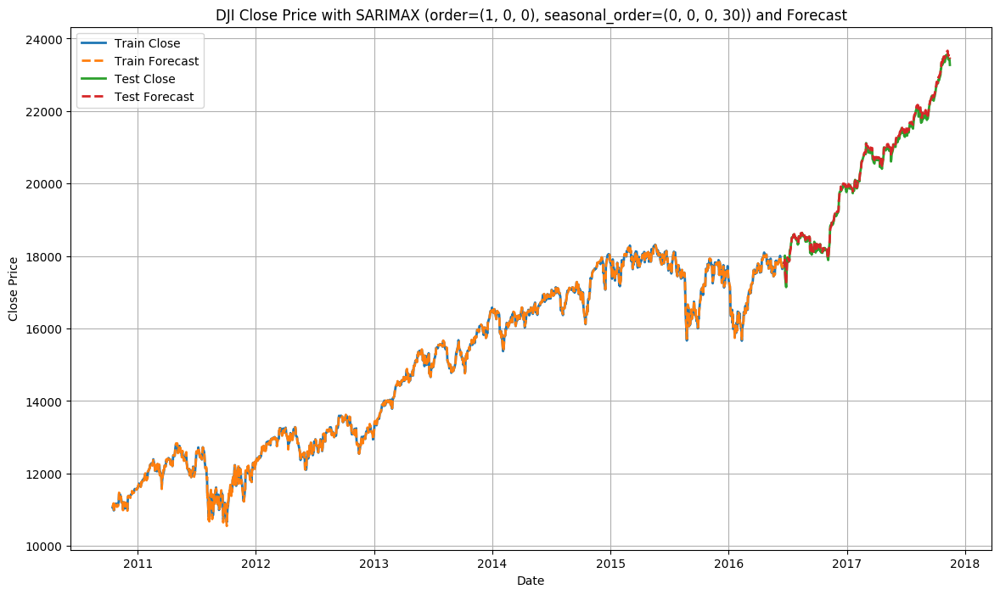

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.49289D+00    |proj g|=  6.66354D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   83      2     14      1     0     0   5.132D-01   4.493D+00
  F =   4.4928946104003380     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


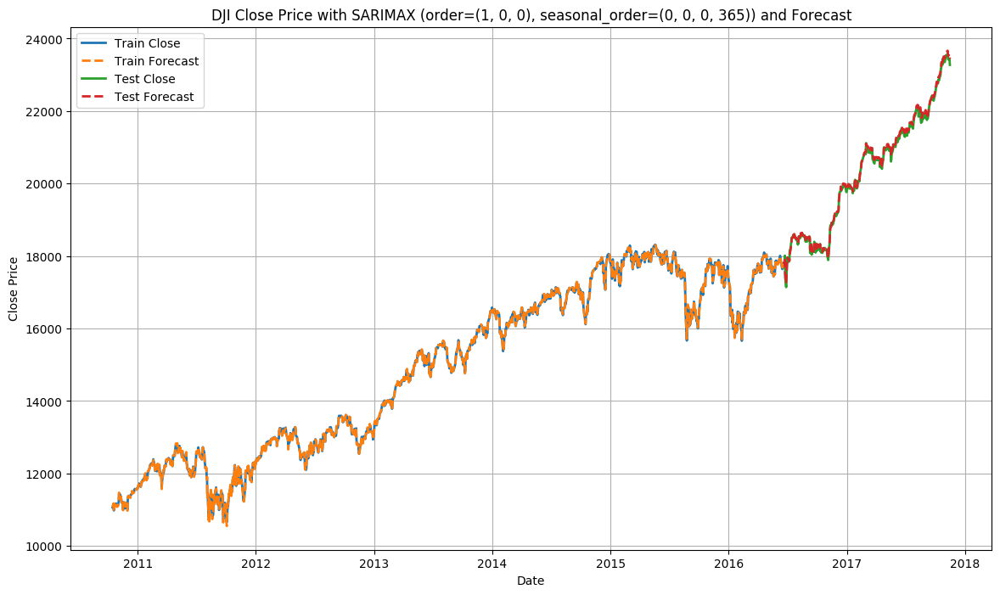

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.49273D+00    |proj g|=  6.77018D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   84      2     12      1     0     0   5.310D-01   4.493D+00
  F =   4.4927333119114605     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


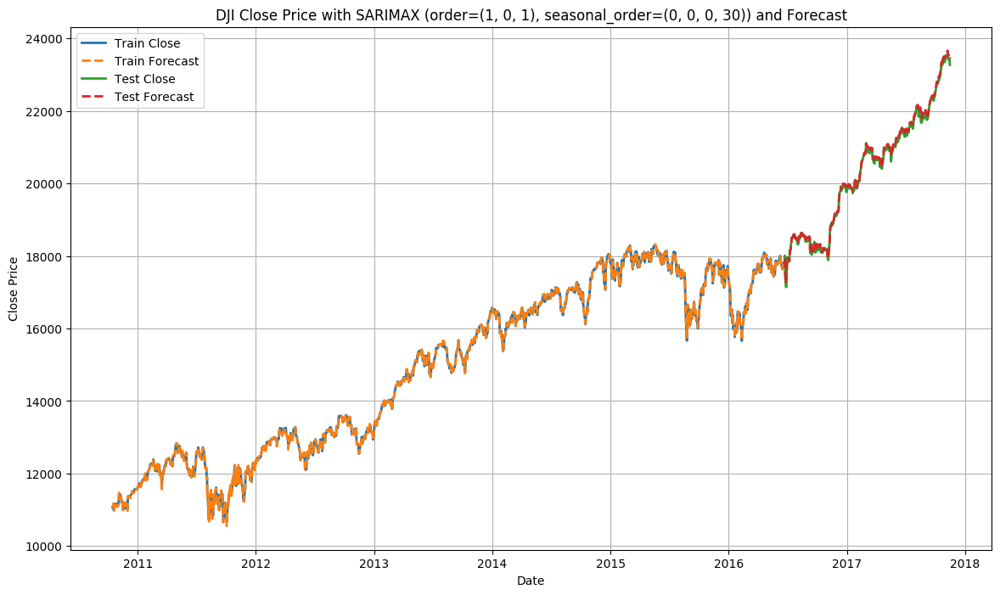

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.49273D+00    |proj g|=  6.77018D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   84      2     12      1     0     0   5.310D-01   4.493D+00
  F =   4.4927333119114605     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


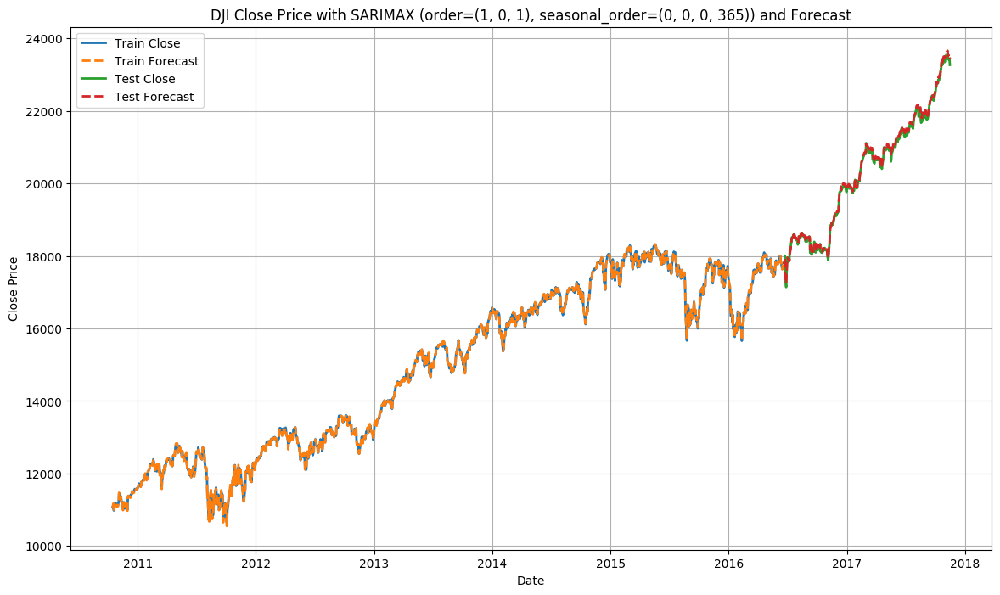

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.26583D+00    |proj g|=  2.90364D-02


 This problem is unconstrained.



At iterate    5    f=  4.26562D+00    |proj g|=  5.12955D-03

At iterate   10    f=  4.26522D+00    |proj g|=  9.31282D-03

At iterate   15    f=  4.26474D+00    |proj g|=  6.33108D-03

At iterate   20    f=  4.26403D+00    |proj g|=  4.43007D-03

At iterate   25    f=  4.26391D+00    |proj g|=  1.93623D-03

At iterate   30    f=  4.26373D+00    |proj g|=  1.15681D-02

At iterate   35    f=  4.26367D+00    |proj g|=  5.95629D-03

At iterate   40    f=  4.26361D+00    |proj g|=  1.40093D-03

At iterate   45    f=  4.26359D+00    |proj g|=  5.11100D-04

At iterate   50    f=  4.26357D+00    |proj g|=  1.84646D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

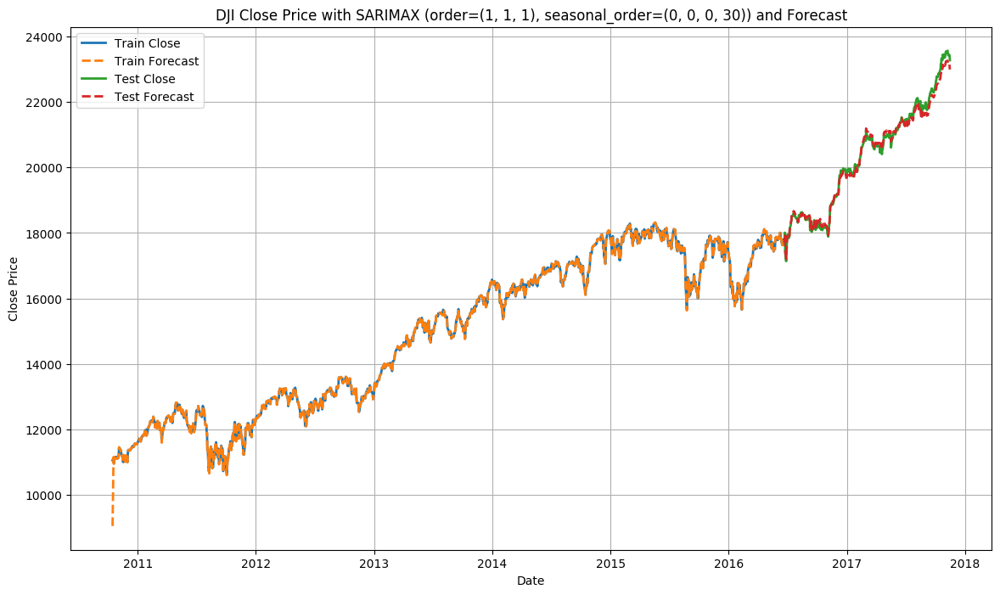

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.26583D+00    |proj g|=  2.90364D-02


 This problem is unconstrained.



At iterate    5    f=  4.26562D+00    |proj g|=  5.12955D-03

At iterate   10    f=  4.26522D+00    |proj g|=  9.31282D-03

At iterate   15    f=  4.26474D+00    |proj g|=  6.33108D-03

At iterate   20    f=  4.26403D+00    |proj g|=  4.43007D-03

At iterate   25    f=  4.26391D+00    |proj g|=  1.93623D-03

At iterate   30    f=  4.26373D+00    |proj g|=  1.15681D-02

At iterate   35    f=  4.26367D+00    |proj g|=  5.95629D-03

At iterate   40    f=  4.26361D+00    |proj g|=  1.40093D-03

At iterate   45    f=  4.26359D+00    |proj g|=  5.11100D-04

At iterate   50    f=  4.26357D+00    |proj g|=  1.84646D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

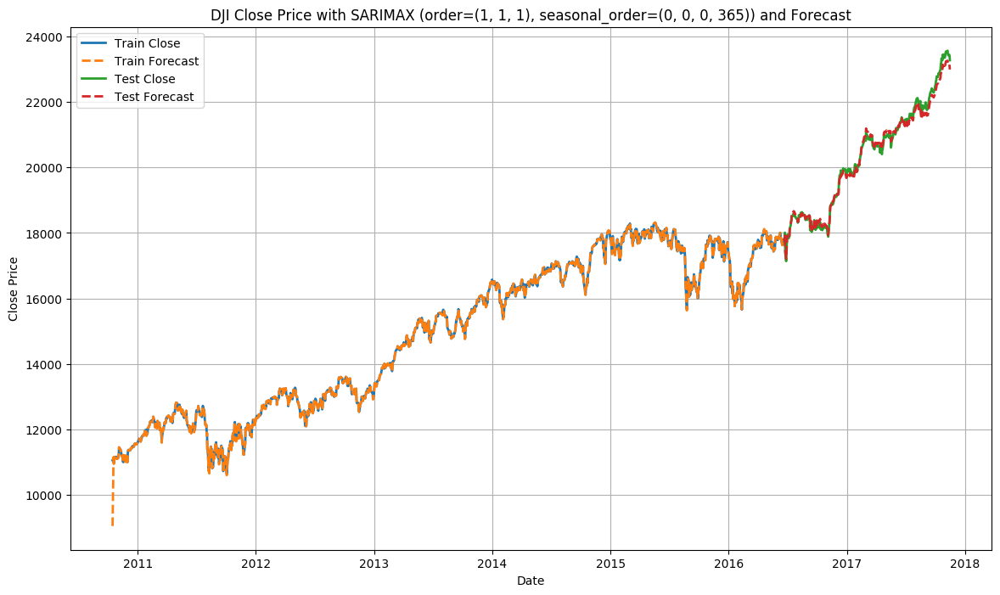

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.56527D+00    |proj g|=  3.91375D-01


 This problem is unconstrained.



At iterate    5    f=  3.56123D+00    |proj g|=  3.20880D-01

At iterate   10    f=  3.54042D+00    |proj g|=  9.63272D-01

At iterate   15    f=  3.52902D+00    |proj g|=  2.32521D-01

At iterate   20    f=  3.50578D+00    |proj g|=  1.09904D-01

At iterate   25    f=  3.49306D+00    |proj g|=  1.07092D-01

At iterate   30    f=  3.48776D+00    |proj g|=  2.26563D-01

At iterate   35    f=  3.47836D+00    |proj g|=  1.87557D-01

At iterate   40    f=  3.47719D+00    |proj g|=  1.01004D-02

At iterate   45    f=  3.47645D+00    |proj g|=  4.06183D-02

At iterate   50    f=  3.47449D+00    |proj g|=  7.12299D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

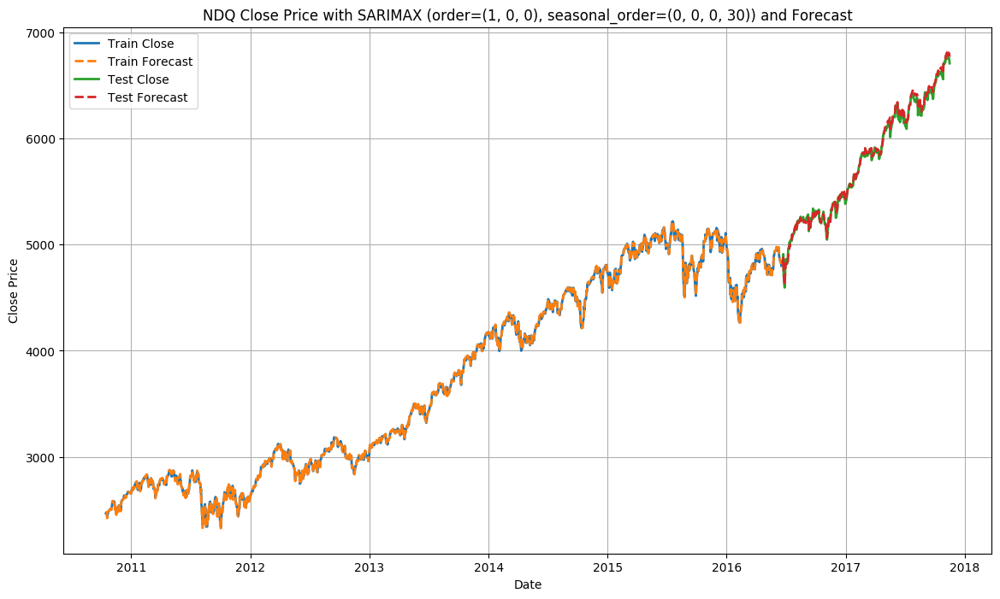

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.56527D+00    |proj g|=  3.91375D-01


 This problem is unconstrained.



At iterate    5    f=  3.56123D+00    |proj g|=  3.20880D-01

At iterate   10    f=  3.54042D+00    |proj g|=  9.63272D-01

At iterate   15    f=  3.52902D+00    |proj g|=  2.32521D-01

At iterate   20    f=  3.50578D+00    |proj g|=  1.09904D-01

At iterate   25    f=  3.49306D+00    |proj g|=  1.07092D-01

At iterate   30    f=  3.48776D+00    |proj g|=  2.26563D-01

At iterate   35    f=  3.47836D+00    |proj g|=  1.87557D-01

At iterate   40    f=  3.47719D+00    |proj g|=  1.01004D-02

At iterate   45    f=  3.47645D+00    |proj g|=  4.06183D-02

At iterate   50    f=  3.47449D+00    |proj g|=  7.12299D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

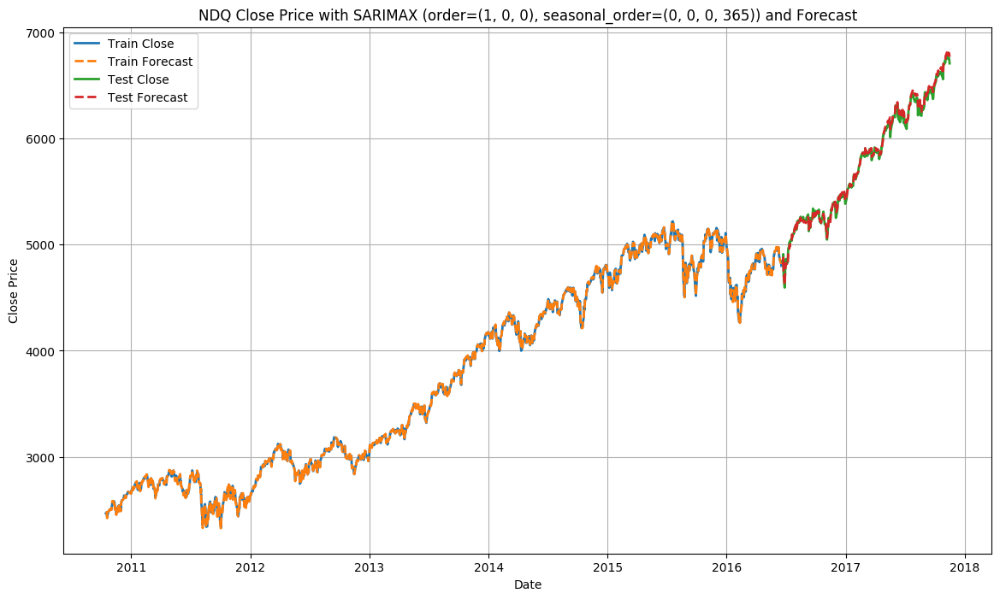

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.56521D+00    |proj g|=  3.92219D-01


 This problem is unconstrained.



At iterate    5    f=  3.56092D+00    |proj g|=  3.99370D-01

At iterate   10    f=  3.54284D+00    |proj g|=  1.51602D+00

At iterate   15    f=  3.53380D+00    |proj g|=  8.71902D-02

At iterate   20    f=  3.52547D+00    |proj g|=  1.23911D+00

At iterate   25    f=  3.51863D+00    |proj g|=  1.64114D-01

At iterate   30    f=  3.51731D+00    |proj g|=  1.07108D-01

At iterate   35    f=  3.51510D+00    |proj g|=  7.11391D-01

At iterate   40    f=  3.50955D+00    |proj g|=  2.35511D-01

At iterate   45    f=  3.50486D+00    |proj g|=  1.40183D+00

At iterate   50    f=  3.50396D+00    |proj g|=  6.10695D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

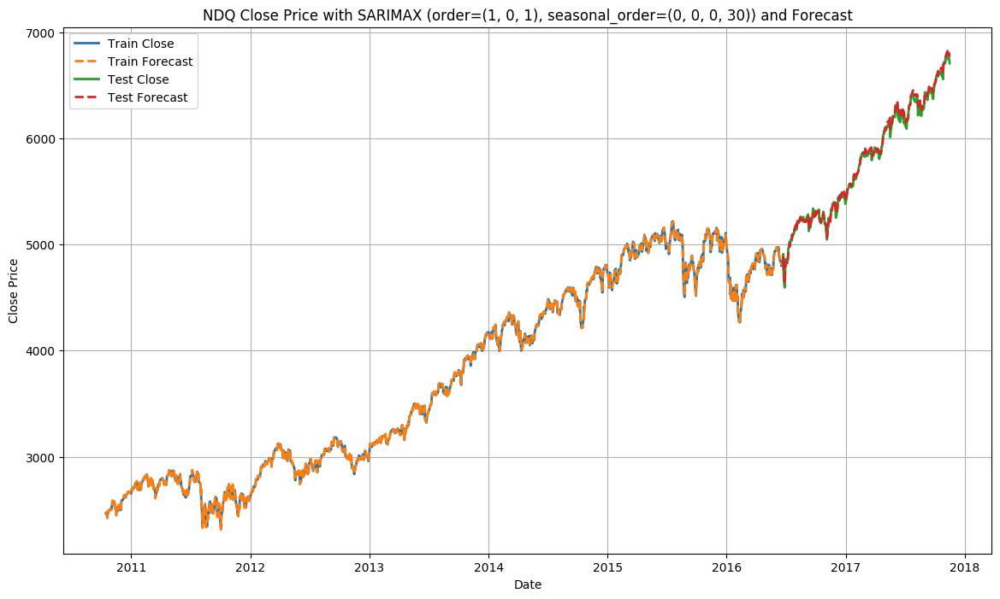

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.56521D+00    |proj g|=  3.92219D-01


 This problem is unconstrained.



At iterate    5    f=  3.56092D+00    |proj g|=  3.99370D-01

At iterate   10    f=  3.54284D+00    |proj g|=  1.51602D+00

At iterate   15    f=  3.53380D+00    |proj g|=  8.71902D-02

At iterate   20    f=  3.52547D+00    |proj g|=  1.23911D+00

At iterate   25    f=  3.51863D+00    |proj g|=  1.64114D-01

At iterate   30    f=  3.51731D+00    |proj g|=  1.07108D-01

At iterate   35    f=  3.51510D+00    |proj g|=  7.11391D-01

At iterate   40    f=  3.50955D+00    |proj g|=  2.35511D-01

At iterate   45    f=  3.50486D+00    |proj g|=  1.40183D+00

At iterate   50    f=  3.50396D+00    |proj g|=  6.10695D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

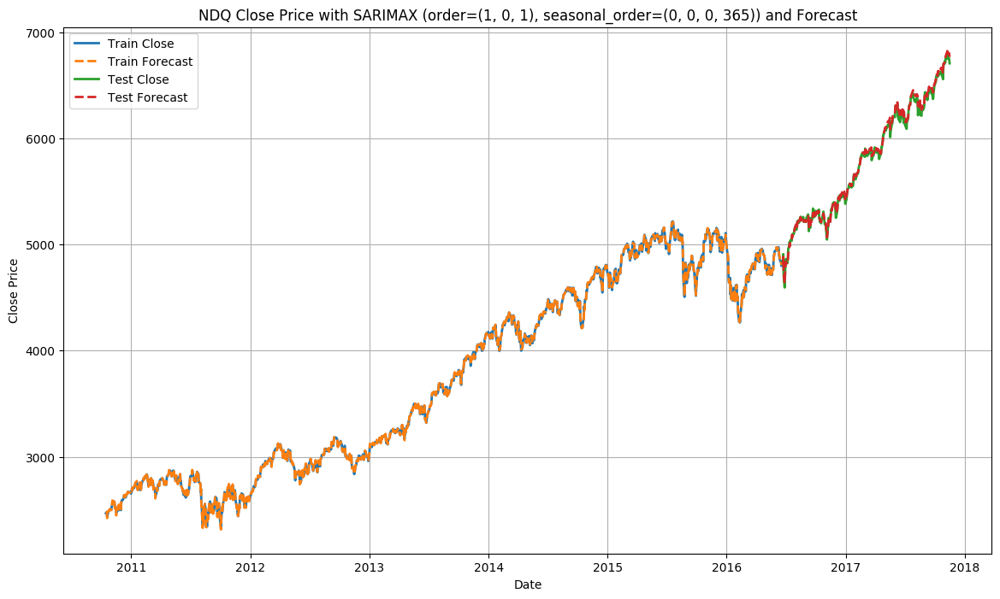

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.42642D+00    |proj g|=  9.04694D-03


 This problem is unconstrained.



At iterate    5    f=  3.42632D+00    |proj g|=  2.52181D-03

At iterate   10    f=  3.42617D+00    |proj g|=  2.45116D-03

At iterate   15    f=  3.42599D+00    |proj g|=  4.75524D-03

At iterate   20    f=  3.42593D+00    |proj g|=  1.12080D-03

At iterate   25    f=  3.42592D+00    |proj g|=  2.55821D-04

At iterate   30    f=  3.42591D+00    |proj g|=  1.76854D-04

At iterate   35    f=  3.42591D+00    |proj g|=  8.99897D-05

At iterate   40    f=  3.42591D+00    |proj g|=  1.32294D-04

At iterate   45    f=  3.42591D+00    |proj g|=  4.48011D-05

At iterate   50    f=  3.42591D+00    |proj g|=  7.90363D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

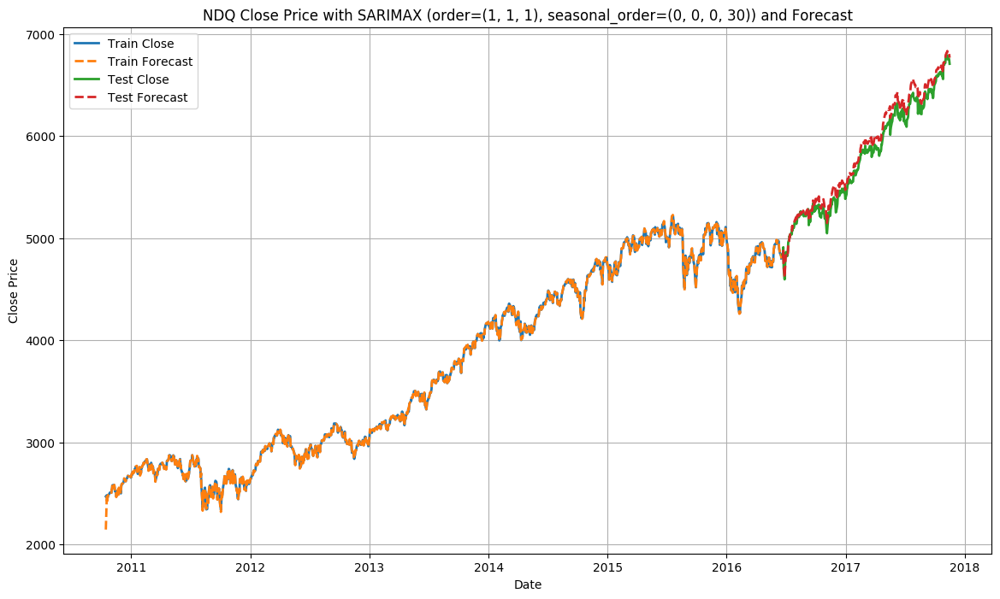

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.42642D+00    |proj g|=  9.04694D-03


 This problem is unconstrained.



At iterate    5    f=  3.42632D+00    |proj g|=  2.52181D-03

At iterate   10    f=  3.42617D+00    |proj g|=  2.45116D-03

At iterate   15    f=  3.42599D+00    |proj g|=  4.75524D-03

At iterate   20    f=  3.42593D+00    |proj g|=  1.12080D-03

At iterate   25    f=  3.42592D+00    |proj g|=  2.55821D-04

At iterate   30    f=  3.42591D+00    |proj g|=  1.76854D-04

At iterate   35    f=  3.42591D+00    |proj g|=  8.99897D-05

At iterate   40    f=  3.42591D+00    |proj g|=  1.32294D-04

At iterate   45    f=  3.42591D+00    |proj g|=  4.48011D-05

At iterate   50    f=  3.42591D+00    |proj g|=  7.90363D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

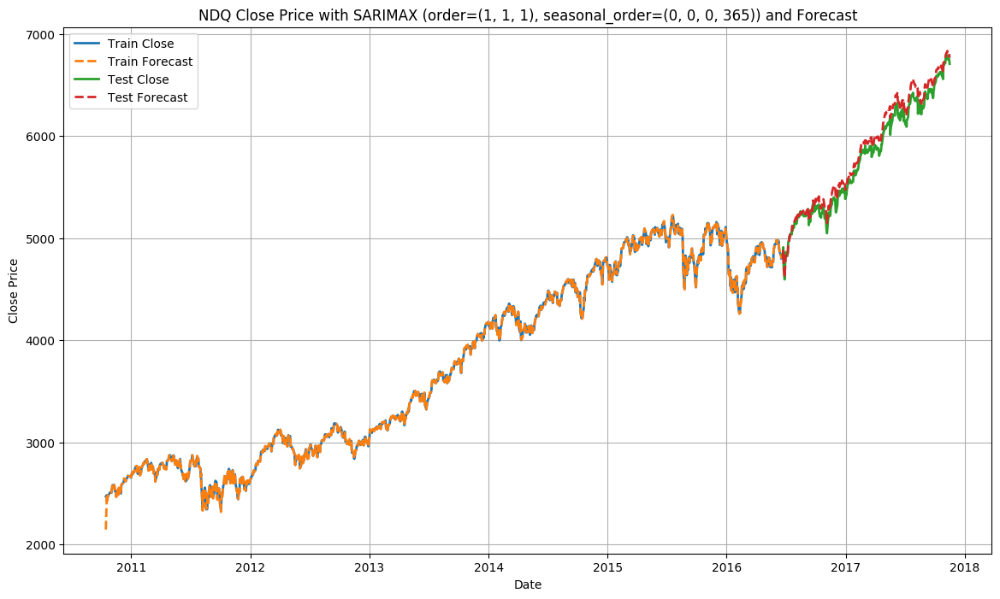

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.05942D+00    |proj g|=  5.82536D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   83      2     23      1     0     0   4.612D-01   4.059D+00
  F =   4.0594228339914649     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


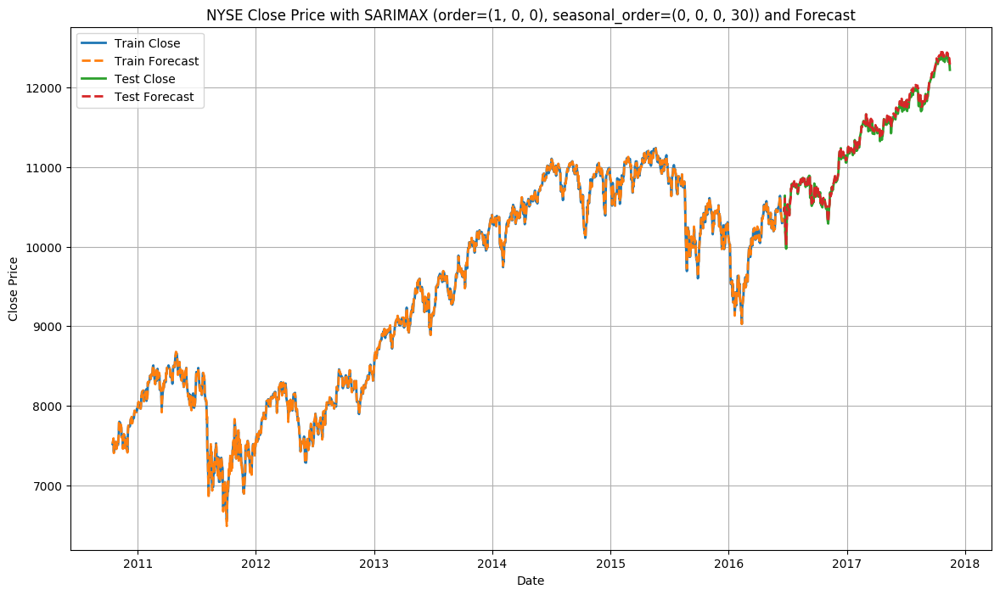

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.05942D+00    |proj g|=  5.82536D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   83      2     23      1     0     0   4.612D-01   4.059D+00
  F =   4.0594228339914649     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


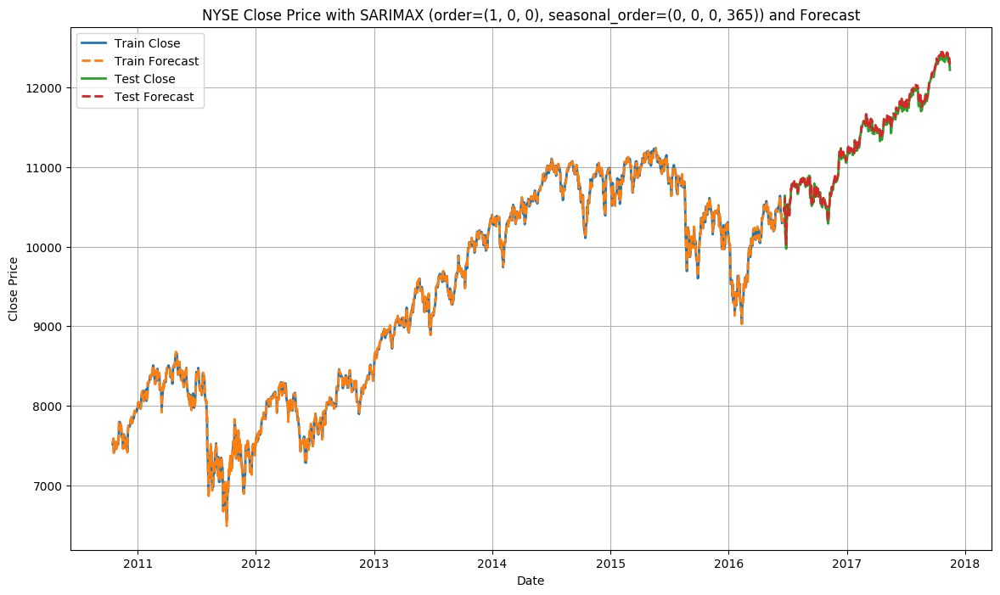

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.05849D+00    |proj g|=  6.01683D-01


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   84      2     44      2     0     0   4.818D-01   4.058D+00
  F =   4.0584947642305575     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


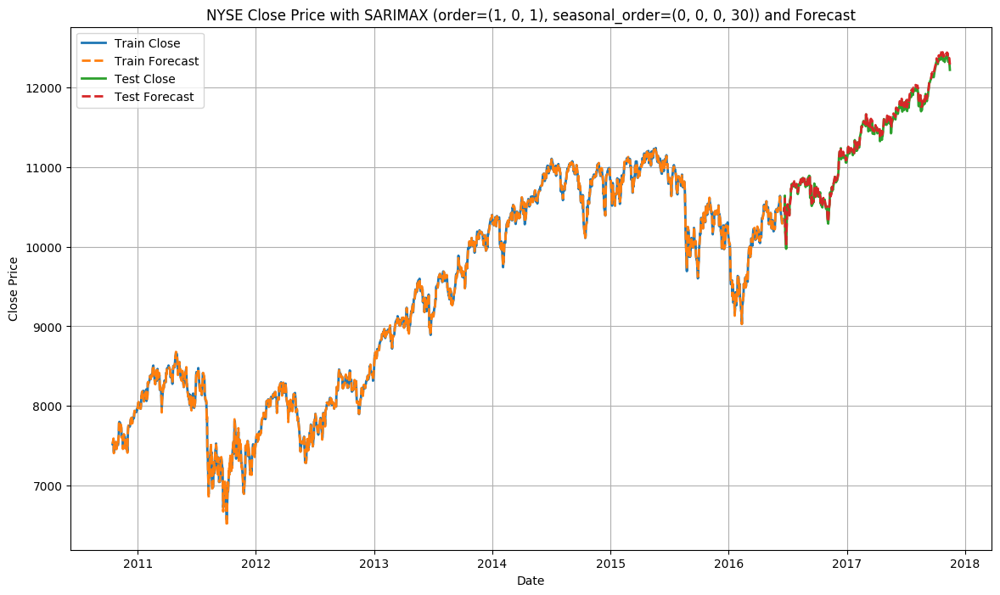

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.05849D+00    |proj g|=  6.01683D-01


 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   84      2     44      2     0     0   4.818D-01   4.058D+00
  F =   4.0584947642305575     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


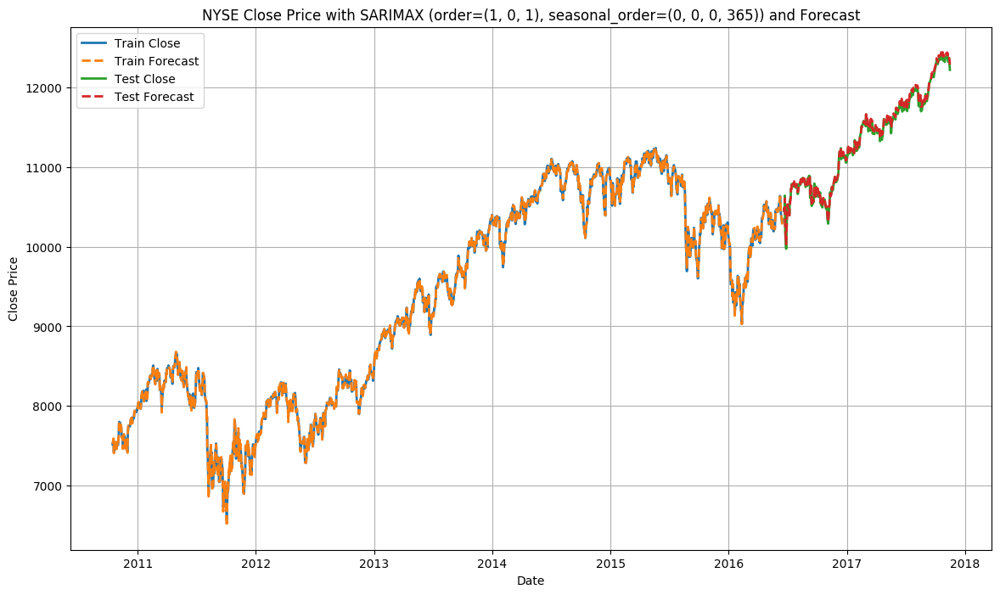

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.77630D+00    |proj g|=  4.41583D-02


 This problem is unconstrained.



At iterate    5    f=  3.77541D+00    |proj g|=  8.99785D-03

At iterate   10    f=  3.77258D+00    |proj g|=  3.75521D-03

At iterate   15    f=  3.77219D+00    |proj g|=  2.89823D-03

At iterate   20    f=  3.77199D+00    |proj g|=  1.73722D-03

At iterate   25    f=  3.77192D+00    |proj g|=  9.00669D-04

At iterate   30    f=  3.77188D+00    |proj g|=  5.10427D-04

At iterate   35    f=  3.77186D+00    |proj g|=  6.42779D-04

At iterate   40    f=  3.77185D+00    |proj g|=  3.37320D-04

At iterate   45    f=  3.77184D+00    |proj g|=  6.23215D-04

At iterate   50    f=  3.77183D+00    |proj g|=  1.25329D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

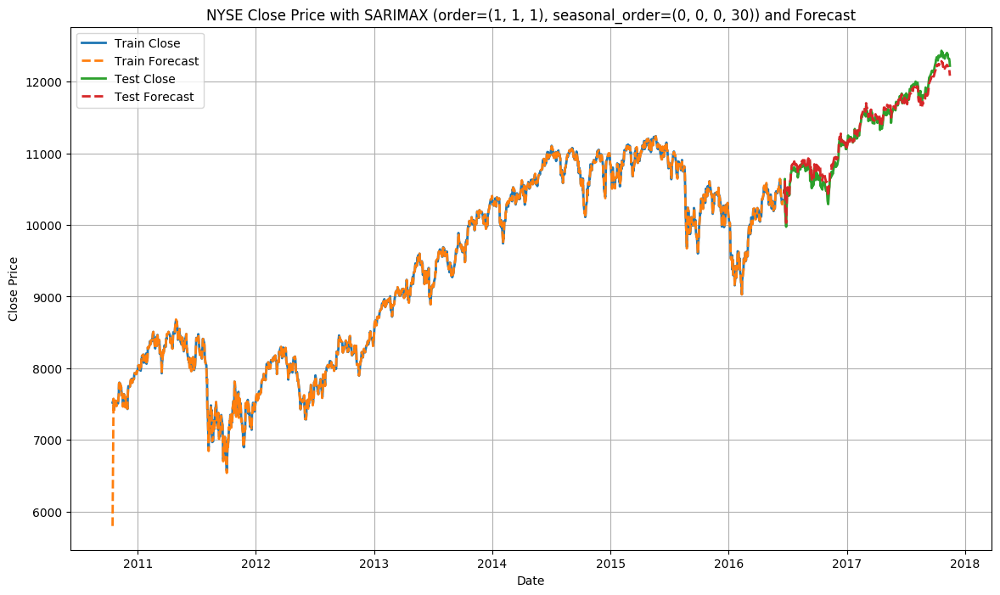

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.77630D+00    |proj g|=  4.41583D-02


 This problem is unconstrained.



At iterate    5    f=  3.77541D+00    |proj g|=  8.99785D-03

At iterate   10    f=  3.77258D+00    |proj g|=  3.75521D-03

At iterate   15    f=  3.77219D+00    |proj g|=  2.89823D-03

At iterate   20    f=  3.77199D+00    |proj g|=  1.73722D-03

At iterate   25    f=  3.77192D+00    |proj g|=  9.00669D-04

At iterate   30    f=  3.77188D+00    |proj g|=  5.10427D-04

At iterate   35    f=  3.77186D+00    |proj g|=  6.42779D-04

At iterate   40    f=  3.77185D+00    |proj g|=  3.37320D-04

At iterate   45    f=  3.77184D+00    |proj g|=  6.23215D-04

At iterate   50    f=  3.77183D+00    |proj g|=  1.25329D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

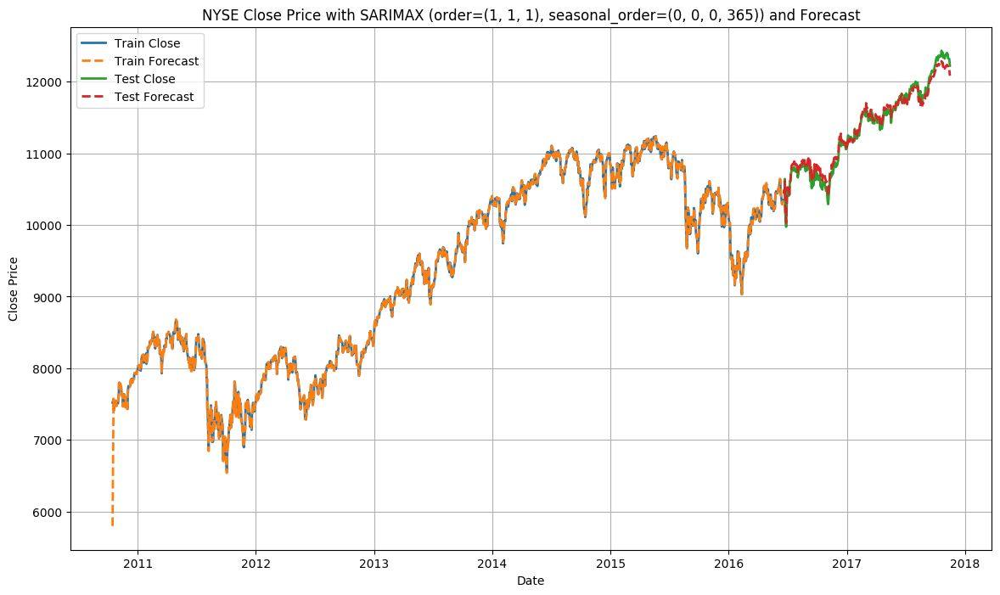

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22489D+00    |proj g|=  3.30191D-01


 This problem is unconstrained.



At iterate    5    f=  2.22489D+00    |proj g|=  2.18603D-01

At iterate   10    f=  2.22478D+00    |proj g|=  2.97064D+00

At iterate   15    f=  2.21392D+00    |proj g|=  2.43539D+01

At iterate   20    f=  2.19123D+00    |proj g|=  1.83352D+00

At iterate   25    f=  2.18508D+00    |proj g|=  6.79453D+00

At iterate   30    f=  2.17887D+00    |proj g|=  4.02156D-01

At iterate   35    f=  2.17822D+00    |proj g|=  3.52870D+00

At iterate   40    f=  2.16469D+00    |proj g|=  1.15846D+01

At iterate   45    f=  2.15985D+00    |proj g|=  2.72962D-01

At iterate   50    f=  2.15815D+00    |proj g|=  3.40834D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

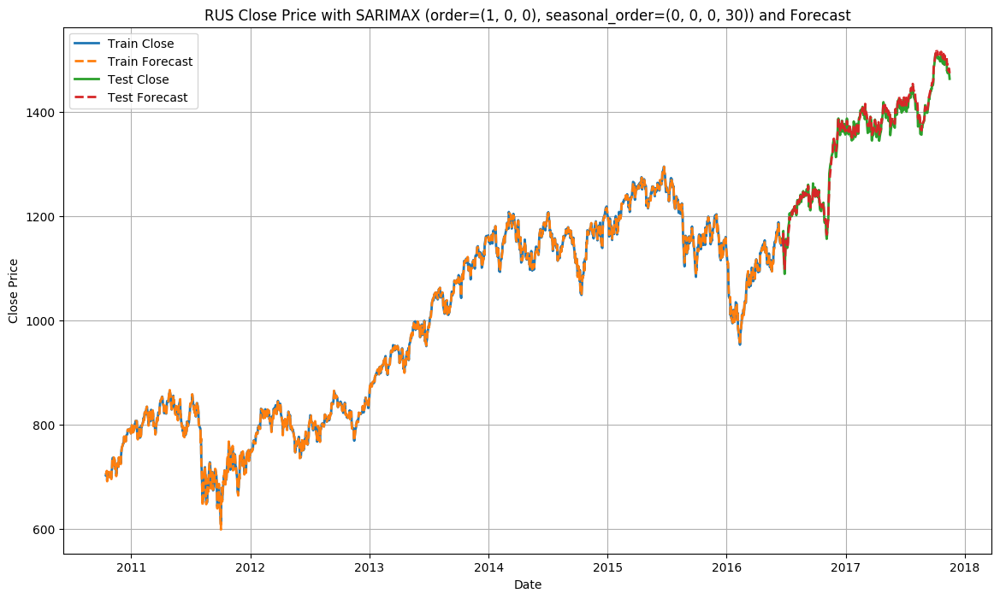

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22489D+00    |proj g|=  3.30191D-01


 This problem is unconstrained.



At iterate    5    f=  2.22489D+00    |proj g|=  2.18603D-01

At iterate   10    f=  2.22478D+00    |proj g|=  2.97064D+00

At iterate   15    f=  2.21392D+00    |proj g|=  2.43539D+01

At iterate   20    f=  2.19123D+00    |proj g|=  1.83352D+00

At iterate   25    f=  2.18508D+00    |proj g|=  6.79453D+00

At iterate   30    f=  2.17887D+00    |proj g|=  4.02156D-01

At iterate   35    f=  2.17822D+00    |proj g|=  3.52870D+00

At iterate   40    f=  2.16469D+00    |proj g|=  1.15846D+01

At iterate   45    f=  2.15985D+00    |proj g|=  2.72962D-01

At iterate   50    f=  2.15815D+00    |proj g|=  3.40834D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

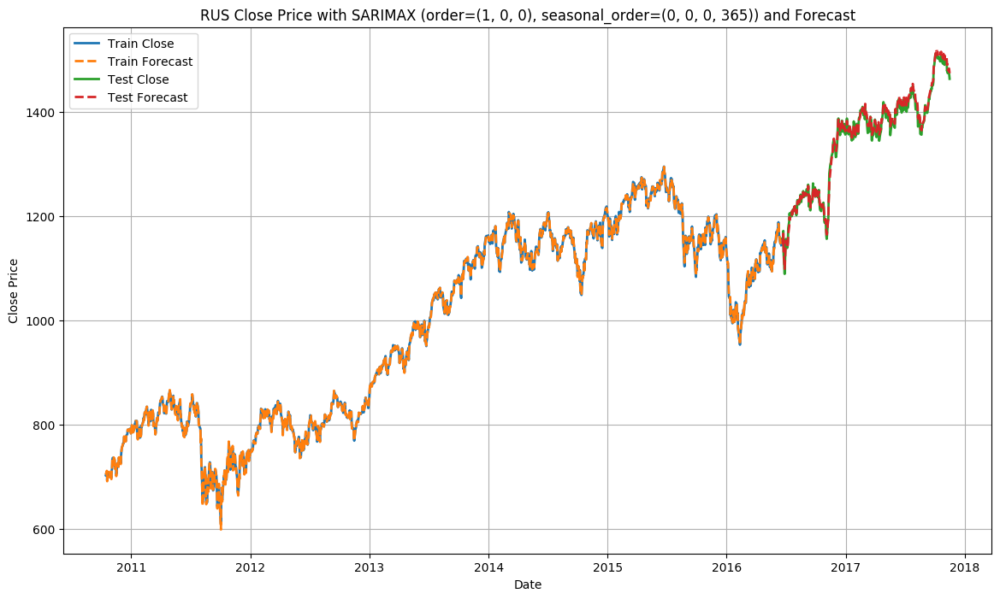

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22488D+00    |proj g|=  3.29928D-01


 This problem is unconstrained.



At iterate    5    f=  2.22488D+00    |proj g|=  2.22290D-01

At iterate   10    f=  2.22477D+00    |proj g|=  3.00058D+00

At iterate   15    f=  2.21368D+00    |proj g|=  2.43607D+01

At iterate   20    f=  2.19147D+00    |proj g|=  3.24710D-01

At iterate   25    f=  2.18071D+00    |proj g|=  6.37114D+00

At iterate   30    f=  2.17425D+00    |proj g|=  1.86833D-01

At iterate   35    f=  2.16972D+00    |proj g|=  4.50872D+00

At iterate   40    f=  2.15595D+00    |proj g|=  8.36817D-02

At iterate   45    f=  2.15590D+00    |proj g|=  3.28633D-01

At iterate   50    f=  2.15493D+00    |proj g|=  4.34400D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

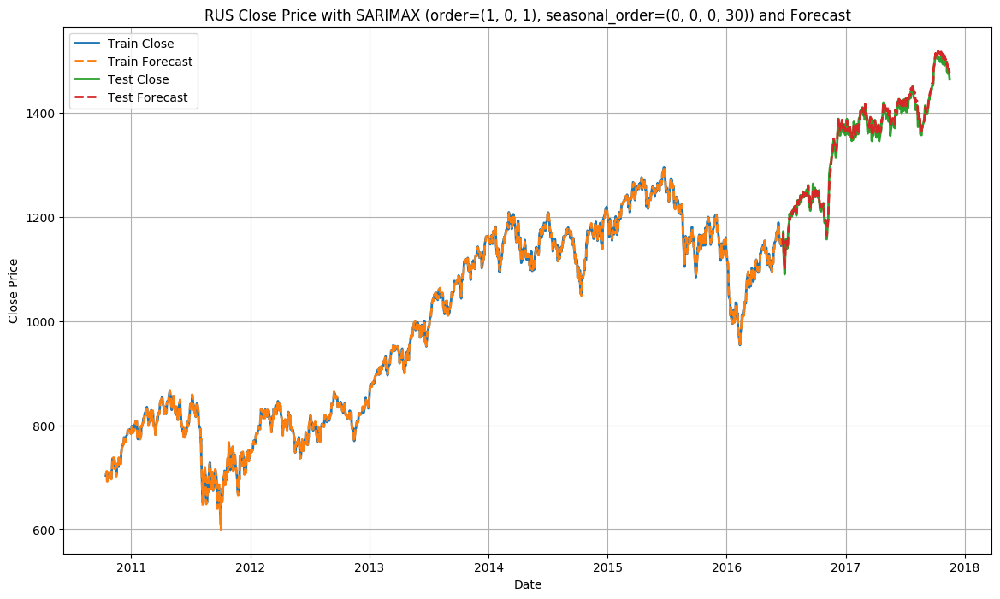

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22488D+00    |proj g|=  3.29928D-01


 This problem is unconstrained.



At iterate    5    f=  2.22488D+00    |proj g|=  2.22290D-01

At iterate   10    f=  2.22477D+00    |proj g|=  3.00058D+00

At iterate   15    f=  2.21368D+00    |proj g|=  2.43607D+01

At iterate   20    f=  2.19147D+00    |proj g|=  3.24710D-01

At iterate   25    f=  2.18071D+00    |proj g|=  6.37114D+00

At iterate   30    f=  2.17425D+00    |proj g|=  1.86833D-01

At iterate   35    f=  2.16972D+00    |proj g|=  4.50872D+00

At iterate   40    f=  2.15595D+00    |proj g|=  8.36817D-02

At iterate   45    f=  2.15590D+00    |proj g|=  3.28633D-01

At iterate   50    f=  2.15493D+00    |proj g|=  4.34400D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

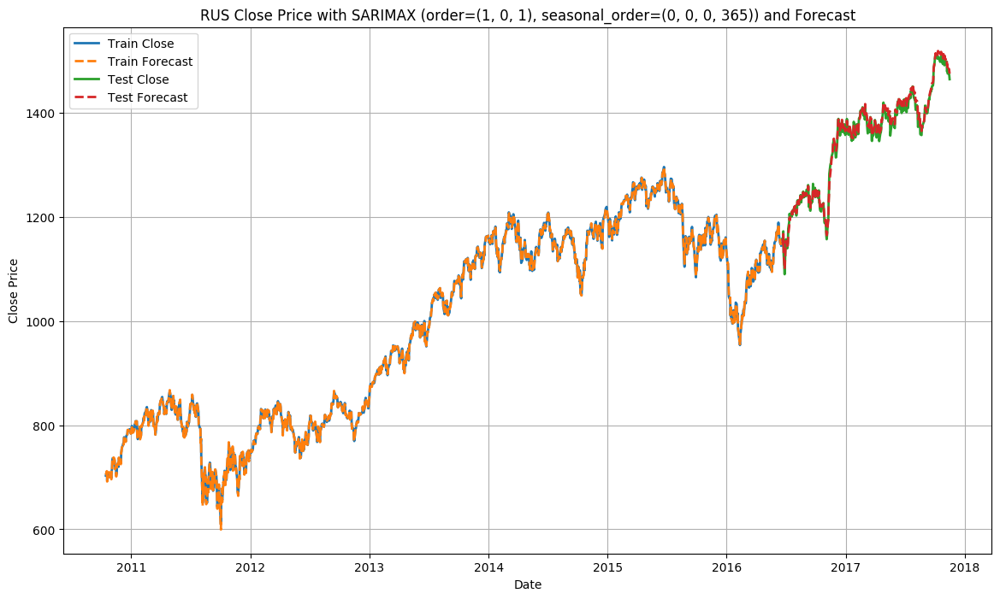

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05510D+00    |proj g|=  2.64091D-02


 This problem is unconstrained.



At iterate    5    f=  2.05368D+00    |proj g|=  6.63146D-03

At iterate   10    f=  2.05363D+00    |proj g|=  4.19301D-03

At iterate   15    f=  2.05359D+00    |proj g|=  1.80421D-03

At iterate   20    f=  2.05355D+00    |proj g|=  2.85919D-03

At iterate   25    f=  2.05341D+00    |proj g|=  1.64839D-03

At iterate   30    f=  2.05332D+00    |proj g|=  2.15290D-03

At iterate   35    f=  2.05317D+00    |proj g|=  2.12265D-03

At iterate   40    f=  2.05304D+00    |proj g|=  1.94617D-03

At iterate   45    f=  2.05299D+00    |proj g|=  9.33324D-04

At iterate   50    f=  2.05295D+00    |proj g|=  1.14217D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

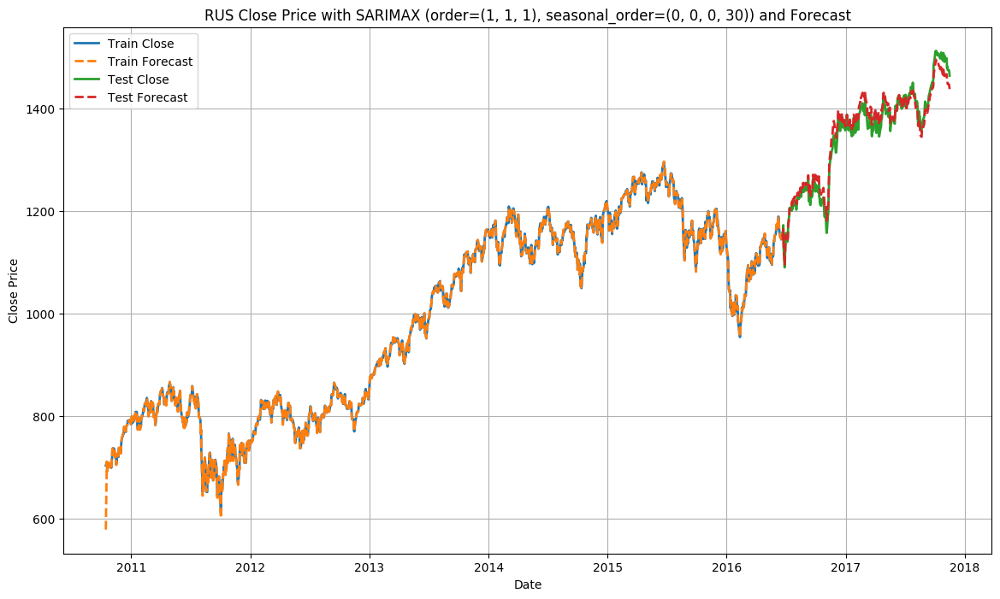

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05510D+00    |proj g|=  2.64091D-02


 This problem is unconstrained.



At iterate    5    f=  2.05368D+00    |proj g|=  6.63146D-03

At iterate   10    f=  2.05363D+00    |proj g|=  4.19301D-03

At iterate   15    f=  2.05359D+00    |proj g|=  1.80421D-03

At iterate   20    f=  2.05355D+00    |proj g|=  2.85919D-03

At iterate   25    f=  2.05341D+00    |proj g|=  1.64839D-03

At iterate   30    f=  2.05332D+00    |proj g|=  2.15290D-03

At iterate   35    f=  2.05317D+00    |proj g|=  2.12265D-03

At iterate   40    f=  2.05304D+00    |proj g|=  1.94617D-03

At iterate   45    f=  2.05299D+00    |proj g|=  9.33324D-04

At iterate   50    f=  2.05295D+00    |proj g|=  1.14217D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

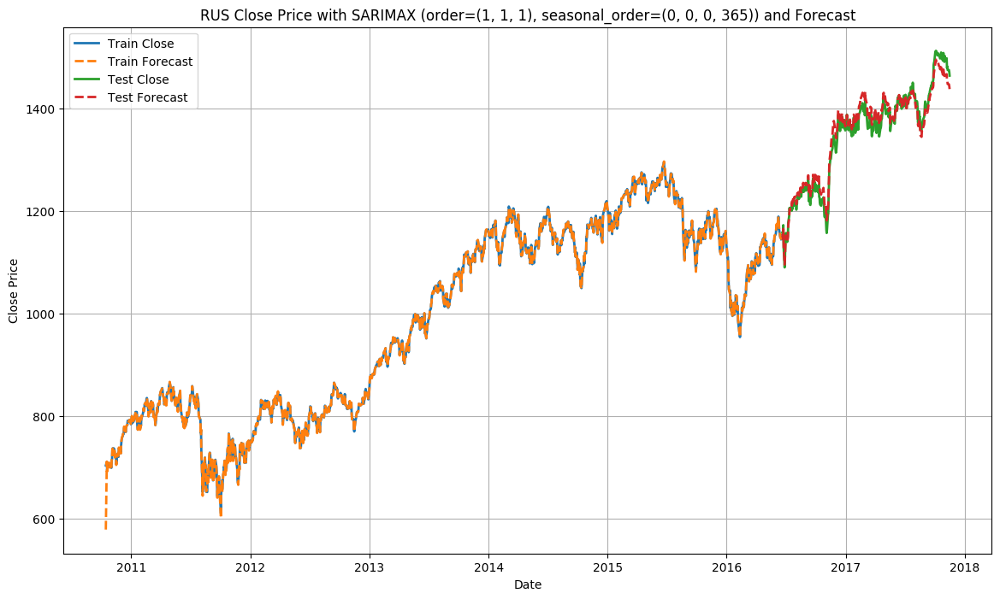

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.48295D+00    |proj g|=  4.81556D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   83      3     20      1     0     0   2.799D-01   2.483D+00
  F =   2.4829448688918792     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


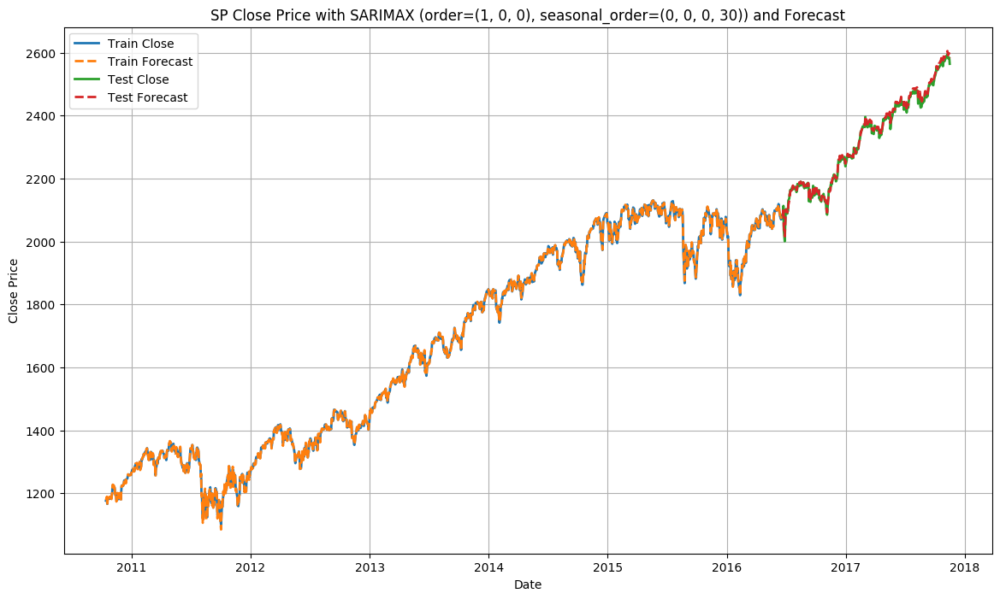

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           83     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.48295D+00    |proj g|=  4.81556D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   83      3     20      1     0     0   2.799D-01   2.483D+00
  F =   2.4829448688918792     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


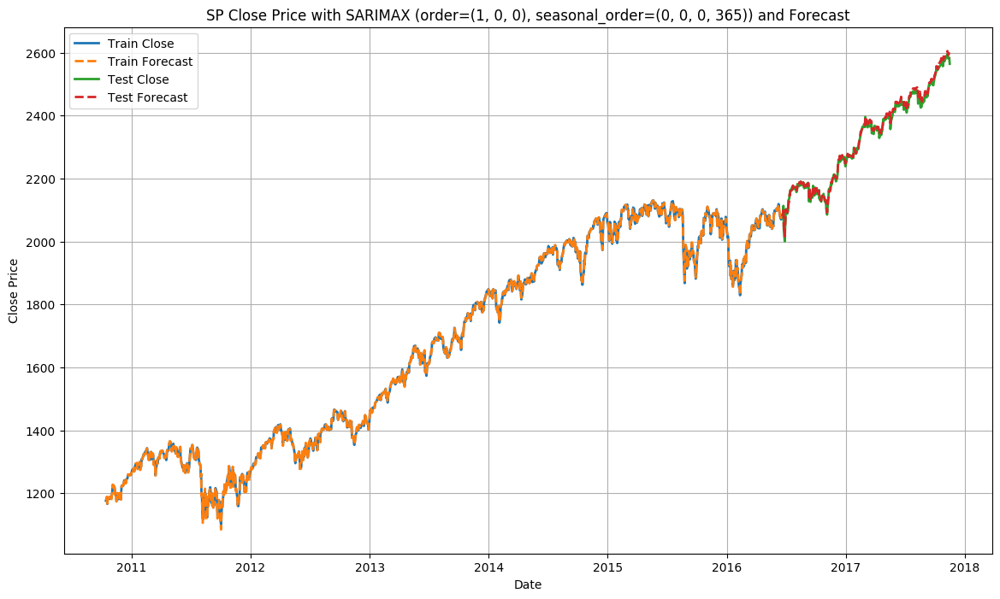

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.48283D+00    |proj g|=  4.86024D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   84      3     17      1     0     0   2.886D-01   2.483D+00
  F =   2.4828253108300178     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


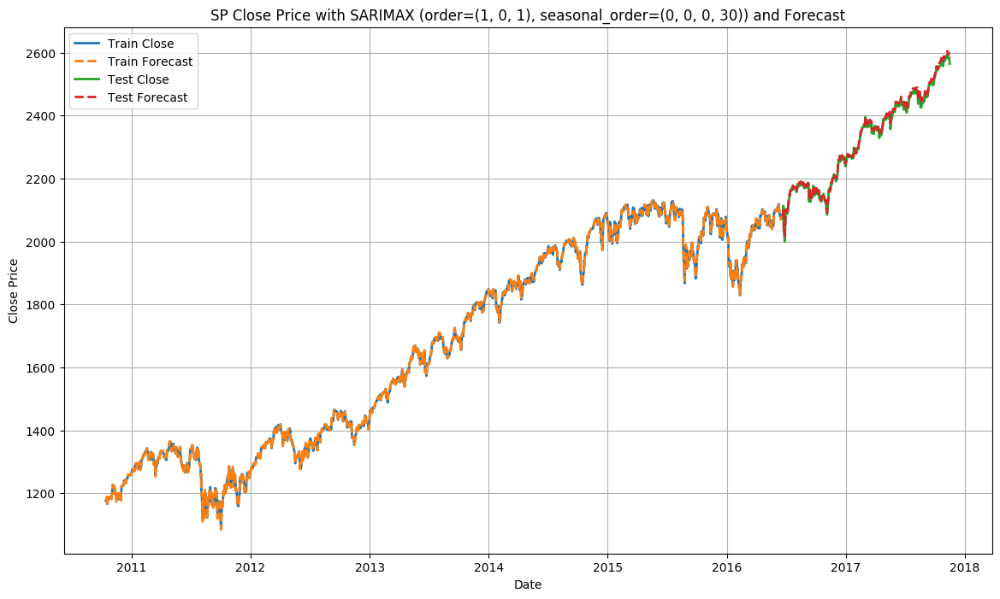

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.48283D+00    |proj g|=  4.86024D-01


 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   84      3     17      1     0     0   2.886D-01   2.483D+00
  F =   2.4828253108300178     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             



   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


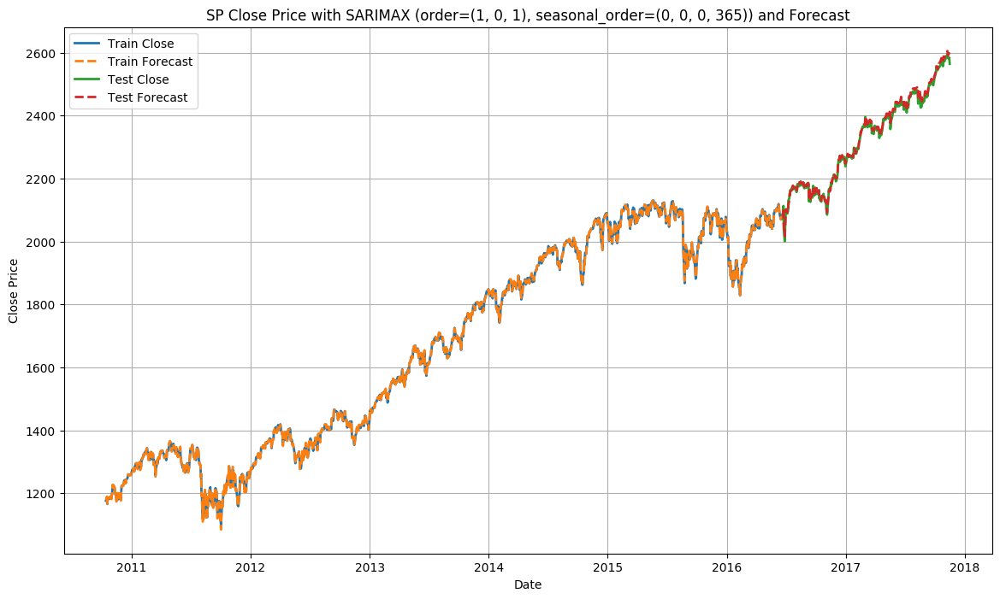

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.31127D+00    |proj g|=  1.19160D-02


 This problem is unconstrained.



At iterate    5    f=  2.31096D+00    |proj g|=  3.18223D-03

At iterate   10    f=  2.31085D+00    |proj g|=  2.78020D-03

At iterate   15    f=  2.31077D+00    |proj g|=  1.30006D-03

At iterate   20    f=  2.31066D+00    |proj g|=  4.12023D-03

At iterate   25    f=  2.31056D+00    |proj g|=  1.23333D-03

At iterate   30    f=  2.31054D+00    |proj g|=  1.06833D-03

At iterate   35    f=  2.31053D+00    |proj g|=  9.67938D-04

At iterate   40    f=  2.31053D+00    |proj g|=  4.34340D-04

At iterate   45    f=  2.31053D+00    |proj g|=  6.02730D-04

At iterate   50    f=  2.31053D+00    |proj g|=  1.33875D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

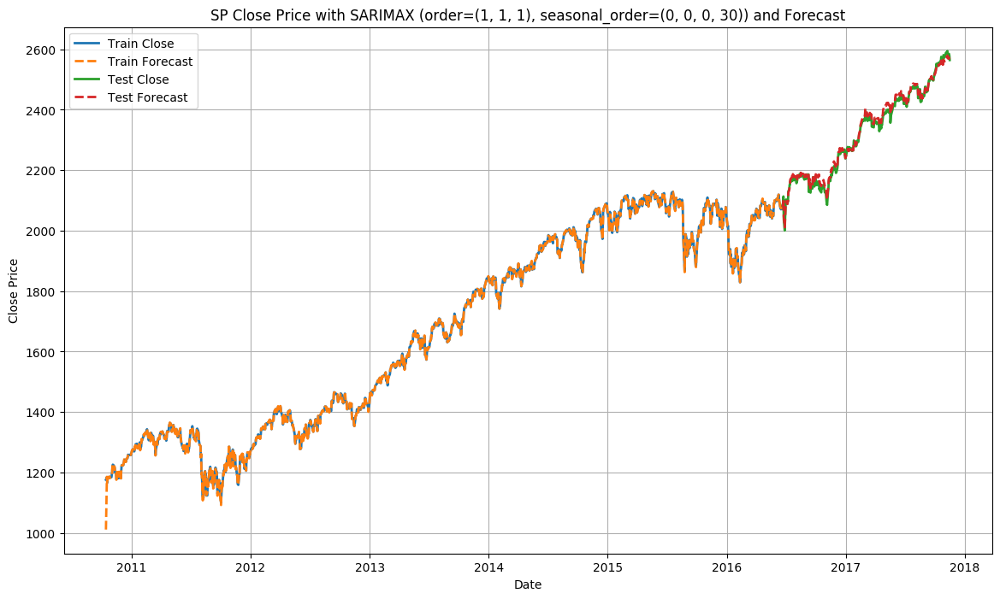

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           84     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.31127D+00    |proj g|=  1.19160D-02


 This problem is unconstrained.



At iterate    5    f=  2.31096D+00    |proj g|=  3.18223D-03

At iterate   10    f=  2.31085D+00    |proj g|=  2.78020D-03

At iterate   15    f=  2.31077D+00    |proj g|=  1.30006D-03

At iterate   20    f=  2.31066D+00    |proj g|=  4.12023D-03

At iterate   25    f=  2.31056D+00    |proj g|=  1.23333D-03

At iterate   30    f=  2.31054D+00    |proj g|=  1.06833D-03

At iterate   35    f=  2.31053D+00    |proj g|=  9.67938D-04

At iterate   40    f=  2.31053D+00    |proj g|=  4.34340D-04

At iterate   45    f=  2.31053D+00    |proj g|=  6.02730D-04

At iterate   50    f=  2.31053D+00    |proj g|=  1.33875D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

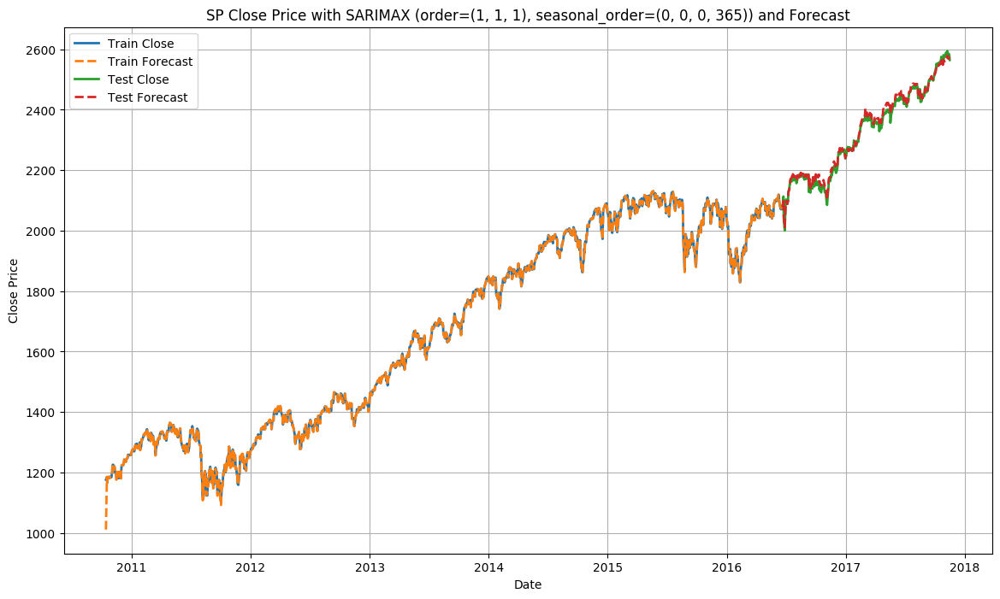

In [18]:
import warnings
warnings.filterwarnings("ignore")
# Create an empty DataFrame to store the R-squared and MSE values
metrics_sarimax = pd.DataFrame(index=['DJI', 'NDQ', 'NYSE', 'RUS', 'SP'])

n_lag_values = [10,30,60]

# Perform forecasts using different order and seasonal_order values and stock exchange data
order_values = [(1, 0, 0), (1,0,1), (1,1,1)]
seasonal_order_values = [(0, 0, 0, 30),(0,0,0,365)]
stock_exchanges = {
    'DJI': DJI,
    'NDQ': NDQ,
    'NYSE': NYSE,
    'RUS': RUS,
    'SP': SP
}

for stock_name, stock_df in stock_exchanges.items():
    for order in order_values:
        for seasonal_order in seasonal_order_values:
            forecast_using_sarimax(stock_name, stock_df, order, seasonal_order)

In [19]:
metrics_sarimax

,"R2_SARIMAX_(1, 0, 0)_(0, 0, 0, 30)","MSE_SARIMAX_(1, 0, 0)_(0, 0, 0, 30)","MAE_SARIMAX_(1, 0, 0)_(0, 0, 0, 30)","MAPE_SARIMAX_(1, 0, 0)_(0, 0, 0, 30)","RMSE_SARIMAX_(1, 0, 0)_(0, 0, 0, 30)","R2_SARIMAX_(1, 0, 0)_(0, 0, 0, 365)","MSE_SARIMAX_(1, 0, 0)_(0, 0, 0, 365)","MAE_SARIMAX_(1, 0, 0)_(0, 0, 0, 365)","MAPE_SARIMAX_(1, 0, 0)_(0, 0, 0, 365)","RMSE_SARIMAX_(1, 0, 0)_(0, 0, 0, 365)",...,"R2_SARIMAX_(1, 1, 1)_(0, 0, 0, 30)","MSE_SARIMAX_(1, 1, 1)_(0, 0, 0, 30)","MAE_SARIMAX_(1, 1, 1)_(0, 0, 0, 30)","MAPE_SARIMAX_(1, 1, 1)_(0, 0, 0, 30)","RMSE_SARIMAX_(1, 1, 1)_(0, 0, 0, 30)","R2_SARIMAX_(1, 1, 1)_(0, 0, 0, 365)","MSE_SARIMAX_(1, 1, 1)_(0, 0, 0, 365)","MAE_SARIMAX_(1, 1, 1)_(0, 0, 0, 365)","MAPE_SARIMAX_(1, 1, 1)_(0, 0, 0, 365)","RMSE_SARIMAX_(1, 1, 1)_(0, 0, 0, 365)"
DJI,0.998677,3535.498250,49.591754,0.238859,59.460056,0.998677,3535.498250,49.591754,0.238859,59.460056,...,0.994133,15674.063470,97.805107,0.462654,125.196100,0.994133,15674.063470,97.805107,0.462654,125.196100
NDQ,0.997617,688.385653,20.326982,0.343653,26.237105,0.997617,688.385653,20.326982,0.343653,26.237105,...,0.974289,7427.889181,77.920208,1.327484,86.185203,0.974289,7427.889181,77.920208,1.327484,86.185203
NYSE,0.997502,846.916372,24.555356,0.213420,29.101828,0.997502,846.916372,24.555356,0.213420,29.101828,...,0.984158,5370.697561,61.566133,0.542817,73.285043,0.984158,5370.697561,61.566133,0.542817,73.285043
RUS,0.995331,43.330941,5.329038,0.390991,6.582624,0.995331,43.330941,5.329038,0.390991,6.582624,...,0.973471,246.192797,13.534138,1.001896,15.690532,0.973471,246.192797,13.534138,1.001896,15.690532
SP,0.997396,54.749879,6.144292,0.259500,7.399316,0.997396,54.749879,6.144292,0.259500,7.399316,...,0.993479,137.129648,9.761166,0.423448,11.710237,0.993479,137.129648,9.761166,0.423448,11.710237
